# 3D Multi-class Segmentation with UNETR  (Muscle, Fat (subcut and internal), Bone, spleen,psoas,spinal cord)

## Setup environment

In [1]:
!pip install -q "monai-weekly[nibabel, tqdm, einops]"
!python -c "import matplotlib" || pip install -q matplotlib
%matplotlib inline

In [2]:
import os
import shutil
import tempfile

import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

from monai.losses import DiceCELoss
from monai.inferers import sliding_window_inference
from monai.transforms import (
    AsDiscrete,
    EnsureChannelFirstd,
    AddChanneld,
    Compose,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    RandFlipd,
    RandCropByPosNegLabeld,
    RandShiftIntensityd,
    SaveImaged,
    ScaleIntensityRanged,
    Spacingd,
    RandRotate90d,
    ToTensord,
)

from monai.config import print_config
from monai.metrics import DiceMetric
from monai.networks.nets import UNETR

from monai.data import (
    DataLoader,
    CacheDataset,
    load_decathlon_datalist,
    decollate_batch,
)


import torch

print_config()

MONAI version: 0.10.dev2231
Numpy version: 1.23.1
Pytorch version: 1.12.0+cu102
MONAI flags: HAS_EXT = False, USE_COMPILED = False, USE_META_DICT = False
MONAI rev id: 8236821c099e5997f7ad0410c5374e4472f4ed14
MONAI __file__: /home/adminbthomas/miniconda3/envs/PT02/lib/python3.9/site-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: 0.4.9
Nibabel version: 4.0.1
scikit-image version: 0.19.3
Pillow version: 9.2.0
Tensorboard version: 2.9.1
gdown version: 4.5.1
TorchVision version: 0.13.0+cu102
tqdm version: 4.64.0
lmdb version: 1.3.0
psutil version: 5.9.1
pandas version: 1.4.3
einops version: 0.4.1
transformers version: 4.20.1
mlflow version: 1.27.0
pynrrd version: NOT INSTALLED or UNKNOWN VERSION.

For details about installing the optional dependencies, please visit:
    https://docs.monai.io/en/latest/installation.html#installing-the-recommended-dependencies



## Setup data directory


In [3]:
# directory = os.environ.get("MONAI_DATA_DIRECTORY")
root_dir = "/home/adminbthomas/Downloads/ensemble/unetr"# root_dir = tempfile.mkdtemp() if directory is None else directory
print(root_dir)

/home/adminbthomas/Downloads/ensemble/unetr


## Setup transforms for training and validation

In [4]:
import datetime
import time

train_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"], ensure_channel_first=True),
#         AddChanneld(keys=["image", "label"]),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(
            keys=["image", "label"],
            pixdim=(1.5, 1.5, 4.0),
            mode=("bilinear", "nearest"),
        ),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=0,
            a_max=250,
            b_min=0.0,
            b_max=1.0,
            clip=False,   # change-intermedouts 
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        RandCropByPosNegLabeld(
            keys=["image", "label"],
            label_key="label",
            spatial_size=(96, 96, 16),
            pos=1,
            neg=1,
            num_samples=4,
            image_key="image",
            image_threshold=0,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[0],
            prob=0.10,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[1],
            prob=0.10,
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[2],
            prob=0.10,
        ),
        RandRotate90d(
            keys=["image", "label"],
            prob=0.10,
            max_k=3,
        ),
        RandShiftIntensityd(
            keys=["image"],
            offsets=0.10,
            prob=0.50,
        ),
        ToTensord(keys=["image", "label"]),
#         SaveImaged(keys="image", meta_keys="image_meta_dict", output_dir="./outMR02_Jul23_Interinputs", output_postfix=datetime.datetime.now().strftime('%f'), resample=False, separate_folder=False),
#         SaveImaged(keys="label", meta_keys="label_meta_dict", output_dir="./outMR02_Jul23_Interinputs", output_postfix=datetime.datetime.now().strftime('%f'), resample=False, separate_folder=False),
    ]
)
val_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"], ensure_channel_first=True),
#         AddChanneld(keys=["image", "label"]),
        Orientationd(keys=["image", "label"], axcodes="RAS"),
        Spacingd(
            keys=["image", "label"],
            pixdim=(1.5, 1.5, 4.0),
            mode=("bilinear", "nearest"),
        ),
        ScaleIntensityRanged(
            keys=["image"], a_min=0, a_max=250, b_min=0.0, b_max=1.0, clip=False
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        ToTensord(keys=["image", "label"]),
    ]
)

### DATA

In [5]:
data_dir = os.path.join(root_dir,"../data/")
print(data_dir)

/home/adminbthomas/Downloads/ensemble/unetr/../data/


In [6]:
split_JSON = "dataset_MR09fold1.json"
datasets = data_dir + split_JSON
datalist = load_decathlon_datalist(datasets, True, "training")
val_files = load_decathlon_datalist(datasets, True, "validation")
train_ds = CacheDataset(
    data=datalist,
    transform=train_transforms,
    cache_num=24,
    cache_rate=1.0,
    num_workers=8,
)
train_loader = DataLoader(
    train_ds, batch_size=1, shuffle=True, num_workers=8, pin_memory=True
)
val_ds = CacheDataset(
    data=val_files, transform=val_transforms, cache_num=6, cache_rate=1.0, num_workers=4
)
val_loader = DataLoader(
    val_ds, batch_size=1, shuffle=False, num_workers=4, pin_memory=True
)

Loading dataset:   0%|                                                                                                                                                       | 0/12 [00:00<?, ?it/s]Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]
Loading dataset: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00,  6.89it/s]


## Check data shape and visualize

image shape: torch.Size([1, 250, 176, 49]), label shape: torch.Size([1, 250, 176, 49])


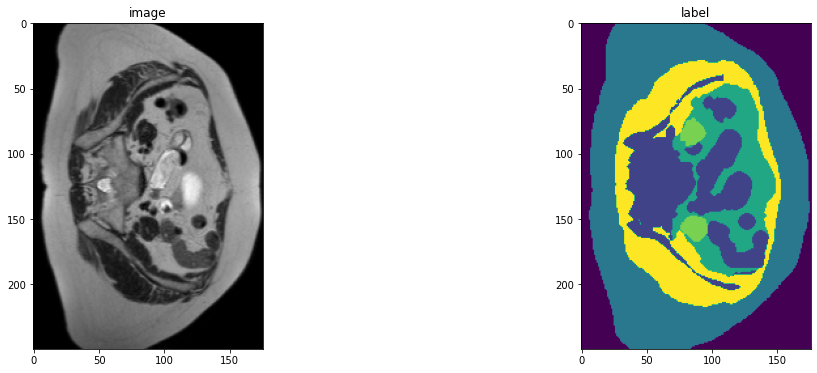

In [7]:
slice_map = {
    "A052_v1_T2W.nii.gz": 10,
    "A052_v1_T2W.nii.gz": 8,
    "A052_v1_T2W.nii.gz": 6
}
case_num = 1
img_name = os.path.split(val_ds[case_num]["image_meta_dict"]["filename_or_obj"])[1]
img = val_ds[case_num]["image"]
label = val_ds[case_num]["label"]
img_shape = img.shape
label_shape = label.shape
print(f"image shape: {img_shape}, label shape: {label_shape}")
plt.figure("image", (18, 6))
plt.subplot(1, 2, 1)
plt.title("image")
plt.imshow(img[0, :, :, slice_map[img_name]].detach().cpu(), cmap="gray")
plt.subplot(1, 2, 2)
plt.title("label")
plt.imshow(label[0, :, :, slice_map[img_name]].detach().cpu())
plt.show()

### Create Model, Loss, Optimizer


In [6]:
# os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
device = torch.device("cuda:1")

model = UNETR(
    in_channels=1,
    out_channels=6,
    img_size=(96, 96, 16),
    feature_size=16,
    hidden_size=768,
    mlp_dim=3072,
    num_heads=12,
    pos_embed="perceptron",
    norm_name="instance",
    res_block=True,
    dropout_rate=0.0,
).to(device)

loss_function = DiceCELoss(to_onehot_y=True, softmax=True)
torch.backends.cudnn.benchmark = True
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)

### Execute a typical PyTorch training process

In [9]:
def validation(epoch_iterator_val):
    model.eval()
    dice_vals = list()
    with torch.no_grad():
        for step, batch in enumerate(epoch_iterator_val):
            val_inputs, val_labels = (batch["image"].to(device), batch["label"].to(device))
            val_outputs = sliding_window_inference(val_inputs, (96, 96, 16), 4, model)
            val_labels_list = decollate_batch(val_labels)
            val_labels_convert = [
                post_label(val_label_tensor) for val_label_tensor in val_labels_list
            ]
            val_outputs_list = decollate_batch(val_outputs)
            val_output_convert = [
                post_pred(val_pred_tensor) for val_pred_tensor in val_outputs_list
            ]
            dice_metric(y_pred=val_output_convert, y=val_labels_convert)
            dice = dice_metric.aggregate().item()
            dice_vals.append(dice)
            epoch_iterator_val.set_description(
                "Validate (%d / %d Steps) (dice=%2.5f)" % (global_step, 10.0, dice)
            )
        dice_metric.reset()
    mean_dice_val = np.mean(dice_vals)
    return mean_dice_val


def train(global_step, train_loader, dice_val_best, global_step_best):
    model.train()
    epoch_loss = 0
    step = 0
    epoch_iterator = tqdm(
        train_loader, desc="Training (X / X Steps) (loss=X.X)", dynamic_ncols=True
    )
    for step, batch in enumerate(epoch_iterator):
        step += 1
        x, y = (batch["image"].to(device), batch["label"].to(device))
#         print(x.shape)
#         print(y.shape)
#         plt.figure("image", (18, 6))
#         plt.subplot(1, 2, 1)
#         plt.title("image")
#         plt.imshow(x[3,0,:,:,4].detach().cpu(), cmap="gray")
#         plt.subplot(1, 2, 2)
#         plt.title("label")
#         plt.imshow(y[3,0,:,:,4].detach().cpu())
#         plt.show()
        logit_map = model(x)
        loss = loss_function(logit_map, y)
        loss.backward()
        epoch_loss += loss.item()
        optimizer.step()
        optimizer.zero_grad()
        epoch_iterator.set_description(
            "Training (%d / %d Steps) (loss=%2.5f)" % (global_step, max_iterations, loss)
        )
        if (
            global_step % eval_num == 0 and global_step != 0
        ) or global_step == max_iterations:
            epoch_iterator_val = tqdm(
                val_loader, desc="Validate (X / X Steps) (dice=X.X)", dynamic_ncols=True
            )
            dice_val = validation(epoch_iterator_val)
            epoch_loss /= step
            epoch_loss_values.append(epoch_loss)
            metric_values.append(dice_val)
            if dice_val > dice_val_best:
                dice_val_best = dice_val
                global_step_best = global_step
                torch.save(
                    model.state_dict(), os.path.join(root_dir, "TestMR09_unetrensemble_fold1.pth")
                )
                print(
                    "Model Was Saved ! Current Best Avg. Dice: {} Current Avg. Dice: {}".format(
                        dice_val_best, dice_val
                    )
                )
            else:
                print(
                    "Model Was Not Saved ! Current Best Avg. Dice: {} Current Avg. Dice: {}".format(
                        dice_val_best, dice_val
                    )
                )
        global_step += 1
        
    return global_step, dice_val_best, global_step_best


max_iterations = 70000
eval_num = 250
post_label = AsDiscrete(to_onehot=6)
post_pred = AsDiscrete(argmax=True, to_onehot=6)
dice_metric = DiceMetric(include_background=True, reduction="mean", get_not_nans=False)
global_step = 0
dice_val_best = 0.0
global_step_best = 0
epoch_loss_values = []
metric_values = []
while global_step < max_iterations:
    global_step, dice_val_best, global_step_best = train(
        global_step, train_loader, dice_val_best, global_step_best
    )
#     print('I am waiting....')
#     time.sleep(1)
model.load_state_dict(torch.load(os.path.join(root_dir, "TestMR09_unetrensemble_fold1.pth")))

Training (251 / 70000 Steps) (loss=1.53767): 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  1.93it/s]

Model Was Saved ! Current Best Avg. Dice: 0.5388197898864746 Current Avg. Dice: 0.5388197898864746


Training (501 / 70000 Steps) (loss=1.63312):  83%|███████████████████████████████████████████████████████████████████████████████████████████████                   | 10/12 [00:03<00:01,  1.78it/s]

Model Was Saved ! Current Best Avg. Dice: 0.5773855845133463 Current Avg. Dice: 0.5773855845133463


Training (751 / 70000 Steps) (loss=1.01585):  67%|████████████████████████████████████████████████████████████████████████████▋                                      | 8/12 [00:03<00:02,  1.75it/s]

Model Was Saved ! Current Best Avg. Dice: 0.5946487585703532 Current Avg. Dice: 0.5946487585703532


Training (1001 / 70000 Steps) (loss=1.66205):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:03<00:03,  1.54it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6101836363474528 Current Avg. Dice: 0.6101836363474528


Training (1251 / 70000 Steps) (loss=0.95310):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:04,  1.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.6101836363474528 Current Avg. Dice: 0.6027299960454305


Training (1501 / 70000 Steps) (loss=1.12711):  17%|███████████████████                                                                                               | 2/12 [00:02<00:12,  1.20s/it]

Model Was Saved ! Current Best Avg. Dice: 0.6248255769411722 Current Avg. Dice: 0.6248255769411722


Training (1751 / 70000 Steps) (loss=0.75415): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  1.75it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6261831720670065 Current Avg. Dice: 0.6261831720670065


Training (2001 / 70000 Steps) (loss=0.71216):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:04<00:01,  1.71it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6284793814023336 Current Avg. Dice: 0.6284793814023336


Training (2251 / 70000 Steps) (loss=0.61615):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:02,  1.68it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6352727015813192 Current Avg. Dice: 0.6352727015813192


Training (2501 / 70000 Steps) (loss=1.23254):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:02<00:03,  1.95it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.6352727015813192 Current Avg. Dice: 0.6290338436762491


Training (2751 / 70000 Steps) (loss=0.76982):  33%|██████████████████████████████████████                                                                            | 4/12 [00:03<00:06,  1.28it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6450182000796 Current Avg. Dice: 0.6450182000796


Training (3001 / 70000 Steps) (loss=0.53328):  17%|███████████████████                                                                                               | 2/12 [00:02<00:12,  1.23s/it]

Model Was Saved ! Current Best Avg. Dice: 0.6488335728645325 Current Avg. Dice: 0.6488335728645325


Training (3251 / 70000 Steps) (loss=0.67884): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  1.75it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6503030061721802 Current Avg. Dice: 0.6503030061721802


Training (3501 / 70000 Steps) (loss=0.61766):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:04<00:01,  1.70it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6553521354993185 Current Avg. Dice: 0.6553521354993185


Training (3751 / 70000 Steps) (loss=0.76769):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:04<00:02,  1.51it/s]

Model Was Saved ! Current Best Avg. Dice: 0.659936765829722 Current Avg. Dice: 0.659936765829722


Training (4001 / 70000 Steps) (loss=0.53296):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:02<00:03,  1.92it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.659936765829722 Current Avg. Dice: 0.6519347826639811


Training (4251 / 70000 Steps) (loss=0.90129):  33%|██████████████████████████████████████                                                                            | 4/12 [00:03<00:06,  1.30it/s]

Model Was Saved ! Current Best Avg. Dice: 0.6629229187965393 Current Avg. Dice: 0.6629229187965393


Training (4501 / 70000 Steps) (loss=0.59241):  17%|███████████████████                                                                                               | 2/12 [00:02<00:12,  1.26s/it]

Model Was Saved ! Current Best Avg. Dice: 0.6992817322413126 Current Avg. Dice: 0.6992817322413126


Training (4751 / 70000 Steps) (loss=0.56960): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.6992817322413126 Current Avg. Dice: 0.6790316104888916


Training (5001 / 70000 Steps) (loss=0.74803):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.6992817322413126 Current Avg. Dice: 0.687265932559967


Training (5251 / 70000 Steps) (loss=0.56560):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:02,  1.66it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7331579724947611 Current Avg. Dice: 0.7331579724947611


Training (5501 / 70000 Steps) (loss=0.61316):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:03<00:03,  1.58it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7430018782615662 Current Avg. Dice: 0.7430018782615662


Training (5751 / 70000 Steps) (loss=0.41517):  33%|██████████████████████████████████████                                                                            | 4/12 [00:03<00:06,  1.32it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7449045976003011 Current Avg. Dice: 0.7449045976003011


Training (6001 / 70000 Steps) (loss=0.53607):  17%|███████████████████                                                                                               | 2/12 [00:02<00:11,  1.19s/it]

Model Was Saved ! Current Best Avg. Dice: 0.7748622099558512 Current Avg. Dice: 0.7748622099558512


Training (6251 / 70000 Steps) (loss=0.57958): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7748622099558512 Current Avg. Dice: 0.7668571869532267


Training (6501 / 70000 Steps) (loss=0.50631):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:04<00:01,  1.76it/s]

Model Was Saved ! Current Best Avg. Dice: 0.7843355735143026 Current Avg. Dice: 0.7843355735143026


Training (6751 / 70000 Steps) (loss=0.39048):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:01,  2.07it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7843355735143026 Current Avg. Dice: 0.7808128197987875


Training (7001 / 70000 Steps) (loss=0.60476):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:02<00:03,  1.92it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7843355735143026 Current Avg. Dice: 0.7810024619102478


Training (7251 / 70000 Steps) (loss=0.69345):  33%|██████████████████████████████████████                                                                            | 4/12 [00:02<00:05,  1.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.7843355735143026 Current Avg. Dice: 0.7761781811714172


Training (7501 / 70000 Steps) (loss=0.48992):  17%|███████████████████                                                                                               | 2/12 [00:02<00:11,  1.20s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8011339902877808 Current Avg. Dice: 0.8011339902877808


Training (7751 / 70000 Steps) (loss=0.73912): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8011339902877808 Current Avg. Dice: 0.7750868797302246


Training (8001 / 70000 Steps) (loss=0.51630):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.11it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8011339902877808 Current Avg. Dice: 0.7827779650688171


Training (8251 / 70000 Steps) (loss=0.48778):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:01,  2.04it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8011339902877808 Current Avg. Dice: 0.7917458812395731


Training (8501 / 70000 Steps) (loss=0.43598):  50%|█████████████████████████████████████████████████████████                                                         | 6/12 [00:02<00:03,  1.92it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8011339902877808 Current Avg. Dice: 0.7974984447161356


Training (8751 / 70000 Steps) (loss=0.56200):  33%|██████████████████████████████████████                                                                            | 4/12 [00:03<00:06,  1.22it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8061325550079346 Current Avg. Dice: 0.8061325550079346


Training (9001 / 70000 Steps) (loss=0.41723):  17%|███████████████████                                                                                               | 2/12 [00:02<00:10,  1.03s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8061325550079346 Current Avg. Dice: 0.8015112082163492


Training (9251 / 70000 Steps) (loss=0.52130): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  1.74it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8111119469006857 Current Avg. Dice: 0.8111119469006857


Training (9501 / 70000 Steps) (loss=0.38368):  83%|██████████████████████████████████████████████████████████████████████████████████████████████▏                  | 10/12 [00:03<00:00,  2.18it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8111119469006857 Current Avg. Dice: 0.7850236892700195


Training (9751 / 70000 Steps) (loss=0.62224):  67%|████████████████████████████████████████████████████████████████████████████                                      | 8/12 [00:03<00:01,  2.11it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8111119469006857 Current Avg. Dice: 0.8077699939409891


Training (10001 / 70000 Steps) (loss=0.39460):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.88it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8111119469006857 Current Avg. Dice: 0.7987030744552612


Training (10251 / 70000 Steps) (loss=0.56667):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8111119469006857 Current Avg. Dice: 0.8039074738820394


Training (10501 / 70000 Steps) (loss=0.40844):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.01s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8111119469006857 Current Avg. Dice: 0.798400859038035


Training (10751 / 70000 Steps) (loss=0.54655): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  1.72it/s]

Model Was Saved ! Current Best Avg. Dice: 0.813732365767161 Current Avg. Dice: 0.813732365767161


Training (11001 / 70000 Steps) (loss=0.42238):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.813732365767161 Current Avg. Dice: 0.7734770178794861


Training (11251 / 70000 Steps) (loss=0.51152):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:02,  2.00it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.813732365767161 Current Avg. Dice: 0.7927124500274658


Training (11501 / 70000 Steps) (loss=0.42071):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.99it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.813732365767161 Current Avg. Dice: 0.799096961816152


Training (11751 / 70000 Steps) (loss=0.37009):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.813732365767161 Current Avg. Dice: 0.8072463671366373


Training (12001 / 70000 Steps) (loss=0.47621):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:11,  1.19s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8151775598526001 Current Avg. Dice: 0.8151775598526001


Training (12251 / 70000 Steps) (loss=0.61856): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8151775598526001 Current Avg. Dice: 0.8044027288754781


Training (12501 / 70000 Steps) (loss=0.58557):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8151775598526001 Current Avg. Dice: 0.81100994348526


Training (12751 / 70000 Steps) (loss=0.57971):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:02,  2.00it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8151775598526001 Current Avg. Dice: 0.8086755871772766


Training (13001 / 70000 Steps) (loss=0.39091):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.92it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8151775598526001 Current Avg. Dice: 0.8051866491635641


Training (13251 / 70000 Steps) (loss=0.38607):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:03<00:06,  1.30it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8154233495394388 Current Avg. Dice: 0.8154233495394388


Training (13501 / 70000 Steps) (loss=0.56408):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.06s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8154233495394388 Current Avg. Dice: 0.8072373270988464


Training (13751 / 70000 Steps) (loss=0.48965): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  1.73it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8176841139793396 Current Avg. Dice: 0.8176841139793396


Training (14001 / 70000 Steps) (loss=0.55164):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:04<00:01,  1.69it/s]

Model Was Saved ! Current Best Avg. Dice: 0.820850690205892 Current Avg. Dice: 0.820850690205892


Training (14251 / 70000 Steps) (loss=0.40385):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.07it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.820850690205892 Current Avg. Dice: 0.8042229811350504


Training (14501 / 70000 Steps) (loss=0.45971):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.94it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.820850690205892 Current Avg. Dice: 0.8178534110387167


Training (14751 / 70000 Steps) (loss=0.35209):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.57it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.820850690205892 Current Avg. Dice: 0.8102026184399923


Training (15001 / 70000 Steps) (loss=0.21422):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.02s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.820850690205892 Current Avg. Dice: 0.8198427557945251


Training (15251 / 70000 Steps) (loss=0.44207): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.18it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.820850690205892 Current Avg. Dice: 0.8063387672106425


Training (15501 / 70000 Steps) (loss=0.36772):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.820850690205892 Current Avg. Dice: 0.8099440534909567


Training (15751 / 70000 Steps) (loss=0.39150):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.04it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.820850690205892 Current Avg. Dice: 0.8204125761985779


Training (16001 / 70000 Steps) (loss=0.30227):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.89it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.820850690205892 Current Avg. Dice: 0.7932648261388143


Training (16251 / 70000 Steps) (loss=0.33755):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.820850690205892 Current Avg. Dice: 0.8162586887677511


Training (16501 / 70000 Steps) (loss=0.30946):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:12,  1.20s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8294822573661804


Training (16751 / 70000 Steps) (loss=0.55139): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8129213253657023


Training (17001 / 70000 Steps) (loss=0.24755):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8125654657681783


Training (17251 / 70000 Steps) (loss=0.43973):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.06it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8089396158854166


Training (17501 / 70000 Steps) (loss=0.33789):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.94it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8132120370864868


Training (17751 / 70000 Steps) (loss=0.46536):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.57it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8184685905774435


Training (18001 / 70000 Steps) (loss=0.37741):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.05s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8228098551432291


Training (18251 / 70000 Steps) (loss=0.36426): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.25it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.813855508963267


Training (18501 / 70000 Steps) (loss=0.44725):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8142655491828918


Training (18751 / 70000 Steps) (loss=0.32764):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.03it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8214850823084513


Training (19001 / 70000 Steps) (loss=0.31885):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.95it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8119377096494039


Training (19251 / 70000 Steps) (loss=0.29207):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8145909309387207


Training (19501 / 70000 Steps) (loss=0.33403):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.01it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8173743883768717


Training (19751 / 70000 Steps) (loss=0.34782): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8232450683911642


Training (20001 / 70000 Steps) (loss=0.36833):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8139875531196594


Training (20251 / 70000 Steps) (loss=0.44401):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.05it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8262338638305664


Training (20501 / 70000 Steps) (loss=0.83512):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.95it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8234697580337524


Training (20751 / 70000 Steps) (loss=0.46919):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8164018392562866


Training (21001 / 70000 Steps) (loss=0.30094):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.05s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8201304276784261


Training (21251 / 70000 Steps) (loss=0.41309): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.26it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8190646370251974


Training (21501 / 70000 Steps) (loss=0.33069):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8169375061988831


Training (21751 / 70000 Steps) (loss=0.32429):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:02,  1.98it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.816550612449646


Training (22001 / 70000 Steps) (loss=0.24602):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.93it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8053962588310242


Training (22251 / 70000 Steps) (loss=0.36522):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8294822573661804 Current Avg. Dice: 0.8148422837257385


Training (22501 / 70000 Steps) (loss=0.32927):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:12,  1.22s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8311021327972412 Current Avg. Dice: 0.8311021327972412


Training (22751 / 70000 Steps) (loss=0.33003): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8311021327972412 Current Avg. Dice: 0.8191277583440145


Training (23001 / 70000 Steps) (loss=0.18908):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.22it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8311021327972412 Current Avg. Dice: 0.8229997952779134


Training (23251 / 70000 Steps) (loss=0.31617):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.00it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8311021327972412 Current Avg. Dice: 0.8223519523938497


Training (23501 / 70000 Steps) (loss=0.57217):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.95it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8311021327972412 Current Avg. Dice: 0.830507755279541


Training (23751 / 70000 Steps) (loss=0.30323):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:03<00:05,  1.34it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8323400219281515 Current Avg. Dice: 0.8323400219281515


Training (24001 / 70000 Steps) (loss=0.41165):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.01it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8323400219281515 Current Avg. Dice: 0.8207770387331644


Training (24251 / 70000 Steps) (loss=0.45754): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8323400219281515 Current Avg. Dice: 0.8111040194829305


Training (24501 / 70000 Steps) (loss=0.22777):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8323400219281515 Current Avg. Dice: 0.821751077969869


Training (24751 / 70000 Steps) (loss=0.27906):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8323400219281515 Current Avg. Dice: 0.8322798013687134


Training (25001 / 70000 Steps) (loss=0.35031):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.85it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8323400219281515 Current Avg. Dice: 0.8189073006312052


Training (25251 / 70000 Steps) (loss=0.34272):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8323400219281515 Current Avg. Dice: 0.8262152473131815


Training (25501 / 70000 Steps) (loss=0.38756):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.04it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8323400219281515 Current Avg. Dice: 0.8084986408551534


Training (25751 / 70000 Steps) (loss=0.34837): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.18it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8323400219281515 Current Avg. Dice: 0.8234861890474955


Training (26001 / 70000 Steps) (loss=0.25579):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8323400219281515 Current Avg. Dice: 0.8104410370190939


Training (26251 / 70000 Steps) (loss=0.20990):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.09it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8323400219281515 Current Avg. Dice: 0.822687566280365


Training (26501 / 70000 Steps) (loss=0.25886):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.93it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8323400219281515 Current Avg. Dice: 0.8213773965835571


Training (26751 / 70000 Steps) (loss=0.27699):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.64it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8323400219281515 Current Avg. Dice: 0.8179788192113241


Training (27001 / 70000 Steps) (loss=0.57204):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.02s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8323400219281515 Current Avg. Dice: 0.8183369835217794


Training (27251 / 70000 Steps) (loss=0.33956): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8323400219281515 Current Avg. Dice: 0.8283529082934061


Training (27501 / 70000 Steps) (loss=0.28492):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.09it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8323400219281515 Current Avg. Dice: 0.8154208858807882


Training (27751 / 70000 Steps) (loss=0.37390):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:02,  1.65it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8340544700622559


Training (28001 / 70000 Steps) (loss=0.27151):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.90it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8212802211443583


Training (28251 / 70000 Steps) (loss=0.41125):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8263407548268636


Training (28501 / 70000 Steps) (loss=0.21285):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.00s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8197584350903829


Training (28751 / 70000 Steps) (loss=0.35843): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8286890784899393


Training (29001 / 70000 Steps) (loss=0.19279):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.14it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8291292389233907


Training (29251 / 70000 Steps) (loss=0.22071):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.08it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8164577682813009


Training (29501 / 70000 Steps) (loss=0.31694):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.90it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8250993490219116


Training (29751 / 70000 Steps) (loss=0.27846):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8272095521291097


Training (30001 / 70000 Steps) (loss=0.26041):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.04it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8278983235359192


Training (30251 / 70000 Steps) (loss=0.34520): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.28it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8248185515403748


Training (30501 / 70000 Steps) (loss=0.33210):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8299726446469625


Training (30751 / 70000 Steps) (loss=0.43807):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.03it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8251892526944479


Training (31001 / 70000 Steps) (loss=0.31170):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.98it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8247610330581665


Training (31251 / 70000 Steps) (loss=0.33479):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.61it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8269644776980082


Training (31501 / 70000 Steps) (loss=0.45628):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.01s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8080295125643412


Training (31751 / 70000 Steps) (loss=0.28577): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8334267139434814


Training (32001 / 70000 Steps) (loss=0.28415):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8332418203353882


Training (32251 / 70000 Steps) (loss=0.44035):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.08it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8317123452822367


Training (32501 / 70000 Steps) (loss=0.42178):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.91it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8200711409250895


Training (32751 / 70000 Steps) (loss=0.29767):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.64it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8316732048988342


Training (33001 / 70000 Steps) (loss=0.37091):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.03it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8316215674082438


Training (33251 / 70000 Steps) (loss=0.30721): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8300127188364664


Training (33501 / 70000 Steps) (loss=0.29308):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8232039014498392


Training (33751 / 70000 Steps) (loss=0.39482):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.01it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8219985961914062


Training (34001 / 70000 Steps) (loss=0.25693):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.92it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8333319624265035


Training (34251 / 70000 Steps) (loss=0.25964):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8276887933413187


Training (34501 / 70000 Steps) (loss=0.51152):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.03s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8332459926605225


Training (34751 / 70000 Steps) (loss=0.32221): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.18it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8293984333674113


Training (35001 / 70000 Steps) (loss=0.39161):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.830782433350881


Training (35251 / 70000 Steps) (loss=0.46557):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.07it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8314074873924255


Training (35501 / 70000 Steps) (loss=0.56982):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.93it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8259848554929098


Training (35751 / 70000 Steps) (loss=0.53002):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.826123038927714


Training (36001 / 70000 Steps) (loss=0.33261):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.01s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8310008843739828


Training (36251 / 70000 Steps) (loss=0.32063): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8328251640001932


Training (36501 / 70000 Steps) (loss=0.37987):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8286657134691874


Training (36751 / 70000 Steps) (loss=0.27247):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8277913928031921


Training (37001 / 70000 Steps) (loss=0.29602):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.90it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8264915347099304


Training (37251 / 70000 Steps) (loss=0.37582):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.833048423131307


Training (37501 / 70000 Steps) (loss=0.28868):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.01s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8273998697598776


Training (37751 / 70000 Steps) (loss=0.48417): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8217827677726746


Training (38001 / 70000 Steps) (loss=0.33033):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.11it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8264942367871603


Training (38251 / 70000 Steps) (loss=0.37821):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.07it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8259218335151672


Training (38501 / 70000 Steps) (loss=0.30405):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.89it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8307442863782247


Training (38751 / 70000 Steps) (loss=0.31272):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.830423374970754


Training (39001 / 70000 Steps) (loss=0.37649):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.01it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8280511498451233


Training (39251 / 70000 Steps) (loss=0.38464): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.27it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8260143001874288


Training (39501 / 70000 Steps) (loss=0.31914):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.14it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8340544700622559 Current Avg. Dice: 0.8329116702079773


Training (39751 / 70000 Steps) (loss=0.31136):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:02,  1.70it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8345864017804464 Current Avg. Dice: 0.8345864017804464


Training (40001 / 70000 Steps) (loss=0.41299):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.88it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8345864017804464 Current Avg. Dice: 0.8303078611691793


Training (40251 / 70000 Steps) (loss=0.26531):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.57it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8345864017804464 Current Avg. Dice: 0.8223795493443807


Training (40501 / 70000 Steps) (loss=0.33628):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.04s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8345864017804464 Current Avg. Dice: 0.8334309657414755


Training (40751 / 70000 Steps) (loss=0.23926): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8345864017804464 Current Avg. Dice: 0.8251907229423523


Training (41001 / 70000 Steps) (loss=0.42907):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8345864017804464 Current Avg. Dice: 0.8307568033536276


Training (41251 / 70000 Steps) (loss=0.28004):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8345864017804464 Current Avg. Dice: 0.829516073067983


Training (41501 / 70000 Steps) (loss=0.33253):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.84it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8345864017804464 Current Avg. Dice: 0.8337899446487427


Training (41751 / 70000 Steps) (loss=0.42510):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8345864017804464 Current Avg. Dice: 0.8341543674468994


Training (42001 / 70000 Steps) (loss=0.40548):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.06it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8345864017804464 Current Avg. Dice: 0.8329164783159891


Training (42251 / 70000 Steps) (loss=0.28978): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8345864017804464 Current Avg. Dice: 0.830987294514974


Training (42501 / 70000 Steps) (loss=0.35401):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:04<00:01,  1.67it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8358332514762878 Current Avg. Dice: 0.8358332514762878


Training (42751 / 70000 Steps) (loss=0.32410):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:02,  1.64it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8362075090408325 Current Avg. Dice: 0.8362075090408325


Training (43001 / 70000 Steps) (loss=0.32824):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.86it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8362075090408325 Current Avg. Dice: 0.8249857227007548


Training (43251 / 70000 Steps) (loss=0.40152):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.56it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8362075090408325 Current Avg. Dice: 0.8311327695846558


Training (43501 / 70000 Steps) (loss=0.33681):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:11,  1.19s/it]

Model Was Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8381625215212504


Training (43751 / 70000 Steps) (loss=0.36813): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8362924655278524


Training (44001 / 70000 Steps) (loss=0.31085):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8318067590395609


Training (44251 / 70000 Steps) (loss=0.19856):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.02it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8298256794611613


Training (44501 / 70000 Steps) (loss=0.28855):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.91it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8345040678977966


Training (44751 / 70000 Steps) (loss=0.37597):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8336501916249593


Training (45001 / 70000 Steps) (loss=0.25644):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.03it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8303207755088806


Training (45251 / 70000 Steps) (loss=0.41716): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.14it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8347398638725281


Training (45501 / 70000 Steps) (loss=0.37283):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.14it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8227413296699524


Training (45751 / 70000 Steps) (loss=0.43002):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8341768980026245


Training (46001 / 70000 Steps) (loss=0.30211):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.86it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.816237211227417


Training (46251 / 70000 Steps) (loss=0.41744):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.65it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8356277545293173


Training (46501 / 70000 Steps) (loss=0.24281):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.05s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.83132537206014


Training (46751 / 70000 Steps) (loss=0.29704): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8346487482388815


Training (47001 / 70000 Steps) (loss=0.27765):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8317522207895914


Training (47251 / 70000 Steps) (loss=0.32511):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.09it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8292483687400818


Training (47501 / 70000 Steps) (loss=0.39325):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.93it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8345721960067749


Training (47751 / 70000 Steps) (loss=0.26982):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.830467422803243


Training (48001 / 70000 Steps) (loss=0.27482):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.00it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8338785568873087


Training (48251 / 70000 Steps) (loss=0.41848): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8295610149701437


Training (48501 / 70000 Steps) (loss=0.26031):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.827245831489563


Training (48751 / 70000 Steps) (loss=0.25037):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.04it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8341015974680582


Training (49001 / 70000 Steps) (loss=0.38082):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.88it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8262464006741842


Training (49251 / 70000 Steps) (loss=0.25486):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8352126081784567


Training (49501 / 70000 Steps) (loss=0.33055):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.05it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8238187034924825


Training (49751 / 70000 Steps) (loss=0.30949): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8326787948608398


Training (50001 / 70000 Steps) (loss=0.27601):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8288407127062479


Training (50251 / 70000 Steps) (loss=0.18464):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8366312781969706


Training (50501 / 70000 Steps) (loss=0.31286):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.92it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8260376652081808


Training (50751 / 70000 Steps) (loss=0.26363):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8156668146451315


Training (51001 / 70000 Steps) (loss=0.32705):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.02s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8317417701085409


Training (51251 / 70000 Steps) (loss=0.24548): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.25it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8322295347849528


Training (51501 / 70000 Steps) (loss=0.32356):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.09it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8176929950714111


Training (51751 / 70000 Steps) (loss=0.30652):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.14it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8266500234603882


Training (52001 / 70000 Steps) (loss=0.29864):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.86it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.832201341787974


Training (52251 / 70000 Steps) (loss=0.28099):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8339144190152487


Training (52501 / 70000 Steps) (loss=0.19074):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.01it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8304532170295715


Training (52751 / 70000 Steps) (loss=0.26424): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.14it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8296998937924703


Training (53001 / 70000 Steps) (loss=0.27804):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8305039604504904


Training (53251 / 70000 Steps) (loss=0.20084):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.09it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8346124688784281


Training (53501 / 70000 Steps) (loss=0.25204):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.90it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8372315367062887


Training (53751 / 70000 Steps) (loss=0.46718):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.59it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8379400173823038


Training (54001 / 70000 Steps) (loss=0.23425):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.01it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8140612641970316


Training (54251 / 70000 Steps) (loss=0.31397): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.20it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8318329652150472


Training (54501 / 70000 Steps) (loss=0.36406):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8381625215212504 Current Avg. Dice: 0.8348430196444193


Training (54751 / 70000 Steps) (loss=0.29576):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:02,  1.68it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8391826152801514 Current Avg. Dice: 0.8391826152801514


Training (55001 / 70000 Steps) (loss=0.30240):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.58it/s]

Model Was Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8403868277867635


Training (55251 / 70000 Steps) (loss=0.30942):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.54it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8279455701510111


Training (55501 / 70000 Steps) (loss=0.32560):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.00it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8288331627845764


Training (55751 / 70000 Steps) (loss=0.33282): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.12it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8375229835510254


Training (56001 / 70000 Steps) (loss=0.36709):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8351185123125712


Training (56251 / 70000 Steps) (loss=0.23414):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.11it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8297757506370544


Training (56501 / 70000 Steps) (loss=0.42642):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.91it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8328670263290405


Training (56751 / 70000 Steps) (loss=0.20251):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.60it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8327142794926962


Training (57001 / 70000 Steps) (loss=0.40034):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.02it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8311487634976705


Training (57251 / 70000 Steps) (loss=0.29683): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8302037715911865


Training (57501 / 70000 Steps) (loss=0.38332):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.14it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.830617626508077


Training (57751 / 70000 Steps) (loss=0.33937):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.07it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8246823946634928


Training (58001 / 70000 Steps) (loss=0.29902):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.92it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8348130385080973


Training (58251 / 70000 Steps) (loss=0.35375):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.63it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8329702814420065


Training (58501 / 70000 Steps) (loss=0.36395):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.02it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8338114221890768


Training (58751 / 70000 Steps) (loss=0.38580): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.25it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8344899415969849


Training (59001 / 70000 Steps) (loss=0.36889):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.14it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8307464321454366


Training (59251 / 70000 Steps) (loss=0.30221):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.05it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8252598841985067


Training (59501 / 70000 Steps) (loss=0.35783):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.87it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8360320925712585


Training (59751 / 70000 Steps) (loss=0.24148):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.57it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8328421513239542


Training (60001 / 70000 Steps) (loss=0.32241):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.04s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.831476092338562


Training (60251 / 70000 Steps) (loss=0.29069): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.24it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8271133502324423


Training (60501 / 70000 Steps) (loss=0.23219):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.17it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8300644357999166


Training (60751 / 70000 Steps) (loss=0.45205):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.824155588944753


Training (61001 / 70000 Steps) (loss=0.13341):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.94it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8247672120730082


Training (61251 / 70000 Steps) (loss=0.35248):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.58it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8366007208824158


Training (61501 / 70000 Steps) (loss=0.23034):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.05it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8276017308235168


Training (61751 / 70000 Steps) (loss=0.29029): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.826044758160909


Training (62001 / 70000 Steps) (loss=0.24760):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.12it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8358800609906515


Training (62251 / 70000 Steps) (loss=0.22631):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.08it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8288909792900085


Training (62501 / 70000 Steps) (loss=0.21857):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.90it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8257963260014852


Training (62751 / 70000 Steps) (loss=0.40204):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8359530369440714


Training (63001 / 70000 Steps) (loss=0.25291):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.02s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8350708882013956


Training (63251 / 70000 Steps) (loss=0.27698): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.23it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8317097028096517


Training (63501 / 70000 Steps) (loss=0.25328):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8319443662961324


Training (63751 / 70000 Steps) (loss=0.28569):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8358495235443115


Training (64001 / 70000 Steps) (loss=0.29419):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.89it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8262508114178976


Training (64251 / 70000 Steps) (loss=0.35419):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:05,  1.57it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8247445623079935


Training (64501 / 70000 Steps) (loss=0.16932):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.00s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.83274245262146


Training (64751 / 70000 Steps) (loss=0.30886): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.835793117682139


Training (65001 / 70000 Steps) (loss=0.30087):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.83086230357488


Training (65251 / 70000 Steps) (loss=0.34530):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.12it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8375063538551331


Training (65501 / 70000 Steps) (loss=0.19281):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.93it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8273100058237711


Training (65751 / 70000 Steps) (loss=0.43197):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.66it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8125057816505432


Training (66001 / 70000 Steps) (loss=0.37596):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.04it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8277479608853658


Training (66251 / 70000 Steps) (loss=0.28065): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.19it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.836295485496521


Training (66501 / 70000 Steps) (loss=0.23771):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.15it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8321319222450256


Training (66751 / 70000 Steps) (loss=0.30453):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.833606501420339


Training (67001 / 70000 Steps) (loss=0.43084):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.92it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8273864189783732


Training (67251 / 70000 Steps) (loss=0.30867):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.61it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8335024913152059


Training (67501 / 70000 Steps) (loss=0.28333):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:10,  1.02s/it]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8253828883171082


Training (67751 / 70000 Steps) (loss=0.33851): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8356843193372091


Training (68001 / 70000 Steps) (loss=0.29984):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.13it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8347906668980917


Training (68251 / 70000 Steps) (loss=0.24882):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.10it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8354146281878153


Training (68501 / 70000 Steps) (loss=0.18437):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:02<00:03,  1.96it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8349582354227701


Training (68751 / 70000 Steps) (loss=0.24017):  33%|█████████████████████████████████████▋                                                                           | 4/12 [00:02<00:04,  1.62it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8360888163248698


Training (69001 / 70000 Steps) (loss=0.33282):  17%|██████████████████▊                                                                                              | 2/12 [00:02<00:09,  1.02it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8383165995279948


Training (69251 / 70000 Steps) (loss=0.30778): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:03<00:00,  2.16it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8305561939875284


Training (69501 / 70000 Steps) (loss=0.27123):  83%|█████████████████████████████████████████████████████████████████████████████████████████████▎                  | 10/12 [00:03<00:00,  2.21it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8355186184247335


Training (69751 / 70000 Steps) (loss=0.26090):  67%|███████████████████████████████████████████████████████████████████████████▎                                     | 8/12 [00:03<00:01,  2.07it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.827655037244161


Training (70001 / 70000 Steps) (loss=0.18880):  50%|████████████████████████████████████████████████████████▌                                                        | 6/12 [00:03<00:03,  1.86it/s]

Model Was Not Saved ! Current Best Avg. Dice: 0.8403868277867635 Current Avg. Dice: 0.8397571245829264


Training (70007 / 70000 Steps) (loss=0.24714): 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:04<00:00,  2.97it/s]


<All keys matched successfully>

In [10]:
print(
    f"train completed, best_metric: {dice_val_best:.4f} "
    f"at iteration: {global_step_best}"
)

train completed, best_metric: 0.8404 at iteration: 55000


### Plot the loss and metric

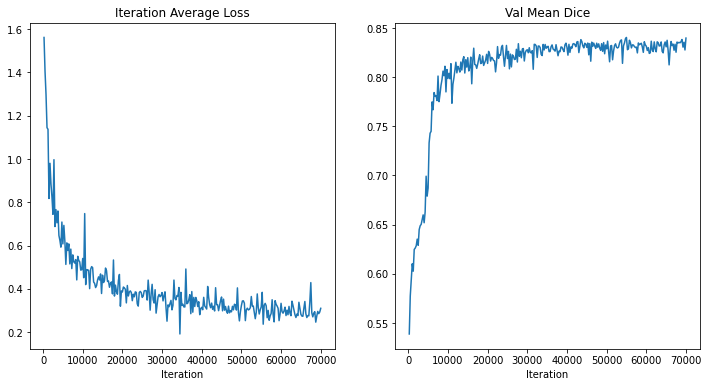

In [11]:
plt.figure("train", (12, 6))
plt.subplot(1, 2, 1)
plt.title("Iteration Average Loss")
x = [eval_num * (i + 1) for i in range(len(epoch_loss_values))]
y = epoch_loss_values
plt.xlabel("Iteration")
plt.plot(x, y)
plt.subplot(1, 2, 2)
plt.title("Val Mean Dice")
x = [eval_num * (i + 1) for i in range(len(metric_values))]
y = metric_values
plt.xlabel("Iteration")
plt.plot(x, y)
plt.show()

### Check best model output with the input image and label

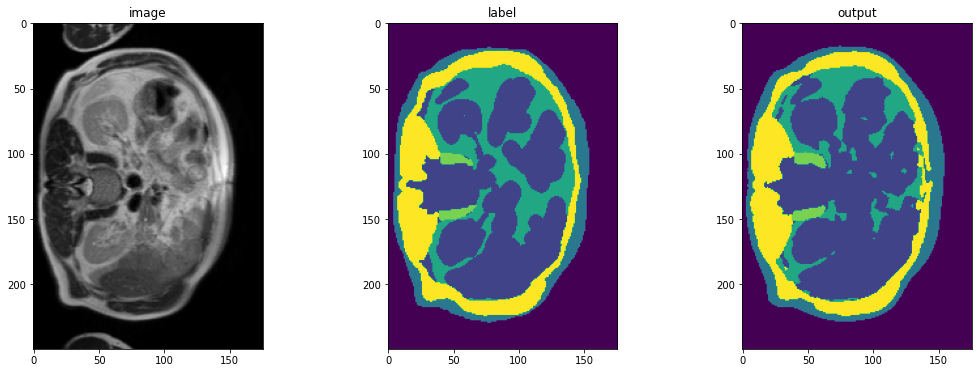

In [12]:
case_num = 0
model.load_state_dict(torch.load(os.path.join(root_dir, "TestMR09_unetrensemble_fold1.pth")))
model.eval()
with torch.no_grad():
    img_name = os.path.split(val_ds[case_num]["image_meta_dict"]["filename_or_obj"])[1]
    img = val_ds[case_num]["image"]
    label = val_ds[case_num]["label"]
    val_inputs = torch.unsqueeze(img, 1).to(device)
    val_labels = torch.unsqueeze(label, 1).to(device)
    val_outputs = sliding_window_inference(
        val_inputs, (96, 96, 16), 4, model, overlap=0.8
    )
    plt.figure("check", (18, 6))
    plt.subplot(1, 3, 1)
    plt.title("image")
    plt.imshow(val_inputs.cpu().numpy()[0, 0, :, :, 5], cmap="gray")
    plt.subplot(1, 3, 2)
    plt.title("label")
    plt.imshow(val_labels.cpu().numpy()[0, 0, :, :, 5])
    plt.subplot(1, 3, 3)
    plt.title("output")
    plt.imshow(
        torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :, 5]
    )
    plt.show()
    

### Inference on test images

In [7]:
import glob
from monai.data import Dataset
from monai.handlers.utils import from_engine
from monai.transforms import (
    AsDiscrete,
    AsDiscreted,
    EnsureChannelFirstd,
    Compose,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    RandCropByPosNegLabeld,
    SaveImaged,
    ScaleIntensityRanged,
    Spacingd,
    EnsureTyped,
    EnsureType,
    Invertd,
)

test_images = sorted(
    glob.glob(os.path.join(root_dir, "../data/imagesTs/", "*.nii.gz")))

test_data = [{"image": image} for image in test_images]


test_org_transforms = Compose(
    [
        LoadImaged(keys="image"),
        EnsureChannelFirstd(keys="image"),
        Orientationd(keys=["image"], axcodes="RAS"),
        Spacingd(keys=["image"], pixdim=(
            1.5, 1.5, 4.0), mode="bilinear"),
        ScaleIntensityRanged(
            keys=["image"], a_min=0, a_max=250,
            b_min=0.0, b_max=1.0, clip=False,
        ),
        CropForegroundd(keys=["image"], source_key="image"),
        EnsureTyped(keys="image"),
    ]
)

test_org_ds = Dataset(
    data=test_data, transform=test_org_transforms)

test_org_loader = DataLoader(test_org_ds, batch_size=1, num_workers=4)

post_transforms = Compose([
    EnsureTyped(keys="pred"),
    Invertd(
        keys="pred",
        transform=test_org_transforms,
        orig_keys="image",
        meta_keys="pred_meta_dict",
        orig_meta_keys="image_meta_dict",
        meta_key_postfix="meta_dict",
        nearest_interp=False,
        to_tensor=True,
    ),
    AsDiscreted(keys="pred", argmax=True, to_onehot=6),
    SaveImaged(keys="pred", meta_keys="pred_meta_dict", output_dir="./outMR09fold1", output_postfix="seg", resample=False, separate_folder=False),
])

Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]
Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]


2024-03-28 07:51:01,605 INFO image_writer.py:194 - writing: outMR09fold1/A002_v1_T2W_seg.nii.gz


Modifying image pixdim from [1.4648438 1.4648438 4.        0.       ] to [  1.46484375   1.46484375   4.         268.45717811]


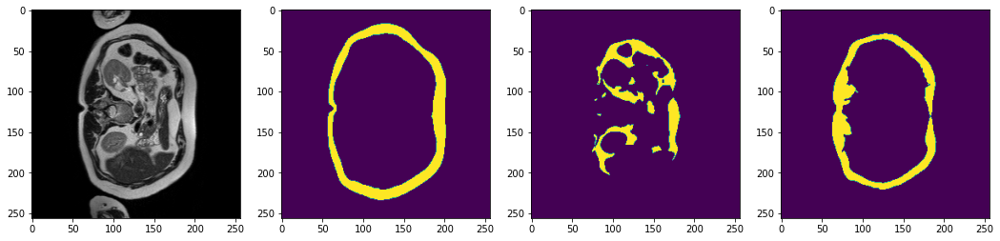

2024-03-28 07:51:04,004 INFO image_writer.py:194 - writing: outMR09fold1/A002_v2_T2W_seg.nii.gz


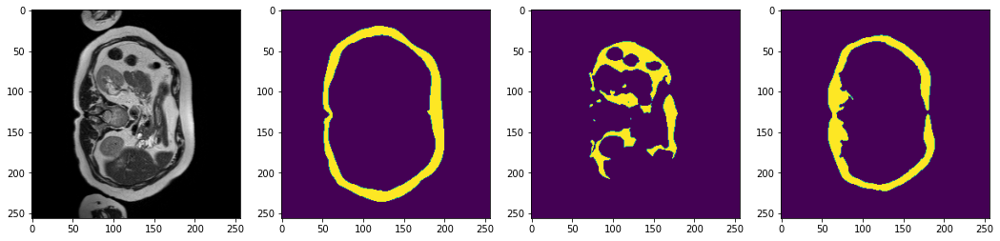

2024-03-28 07:51:06,343 INFO image_writer.py:194 - writing: outMR09fold1/A002_v3_T2W_seg.nii.gz


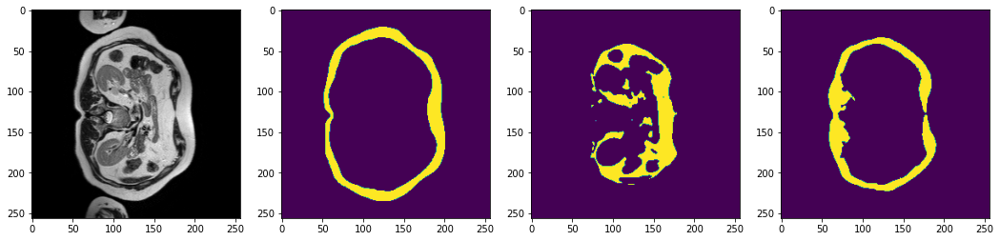

2024-03-28 07:51:08,634 INFO image_writer.py:194 - writing: outMR09fold1/A003_v1_T2W_seg.nii.gz


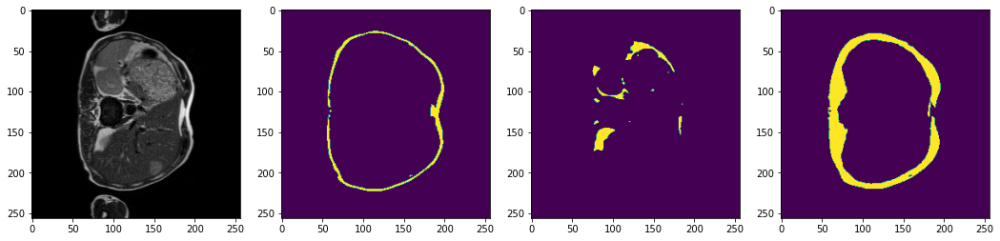

2024-03-28 07:51:10,933 INFO image_writer.py:194 - writing: outMR09fold1/A003_v2_T2W_seg.nii.gz


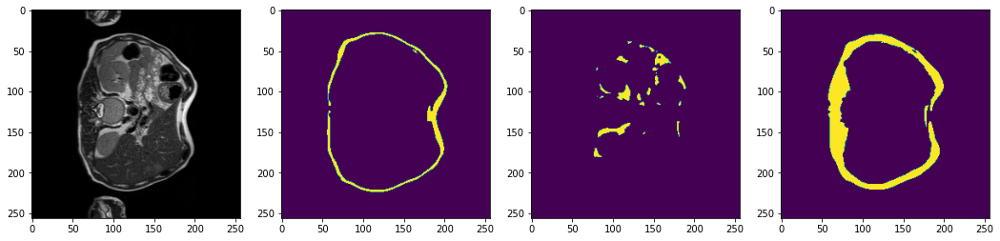

2024-03-28 07:51:13,274 INFO image_writer.py:194 - writing: outMR09fold1/A009_v1_T2W_seg.nii.gz


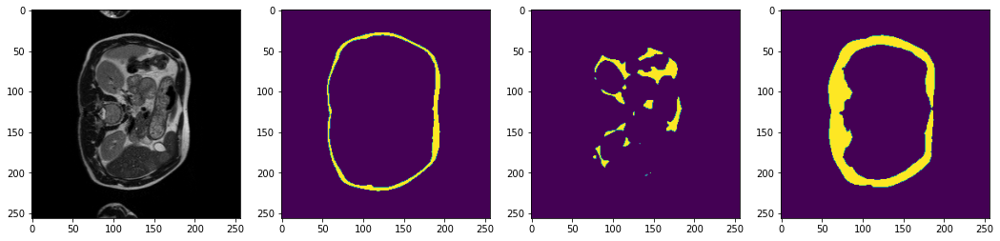

2024-03-28 07:51:15,589 INFO image_writer.py:194 - writing: outMR09fold1/A009_v2_T2W_seg.nii.gz


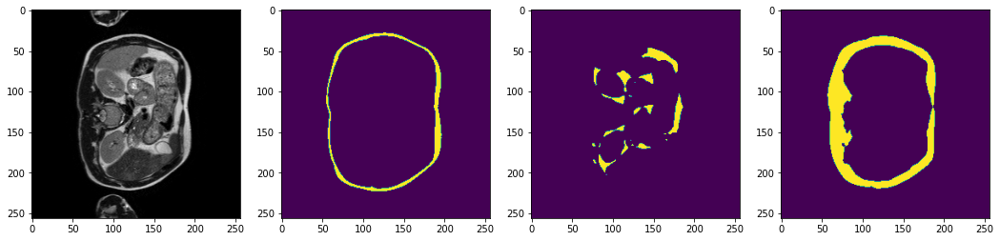

2024-03-28 07:51:18,072 INFO image_writer.py:194 - writing: outMR09fold1/A011_v1_T2W_seg.nii.gz


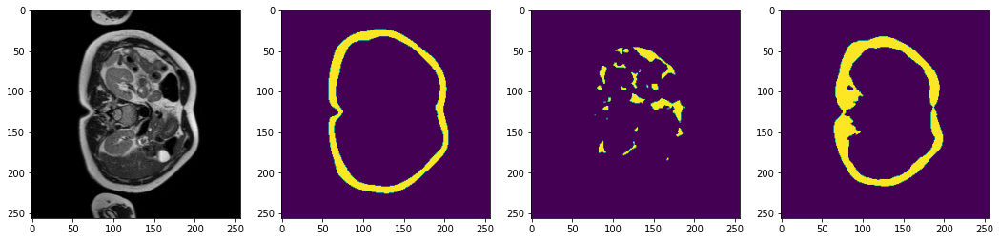

2024-03-28 07:51:20,452 INFO image_writer.py:194 - writing: outMR09fold1/A011_v2_T2W_seg.nii.gz


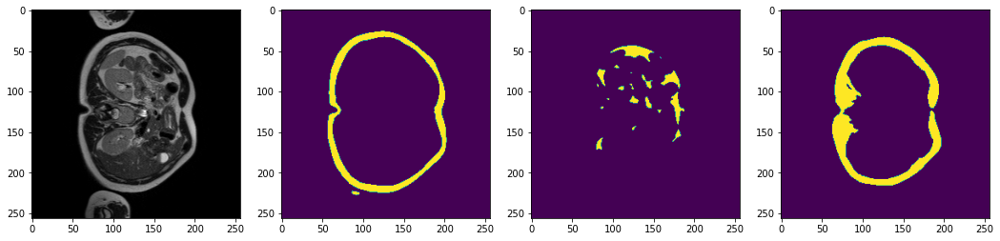

2024-03-28 07:51:22,806 INFO image_writer.py:194 - writing: outMR09fold1/A013_v1_T2W_seg.nii.gz


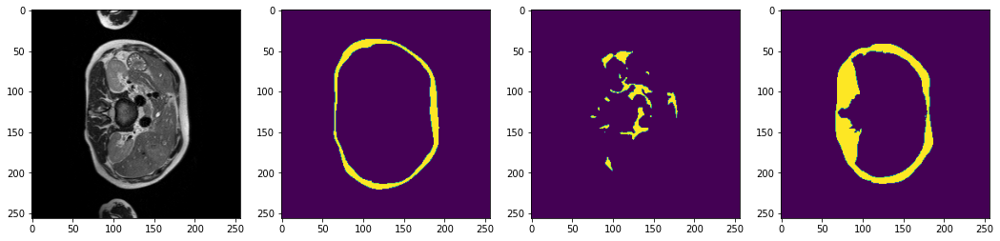

2024-03-28 07:51:24,841 INFO image_writer.py:194 - writing: outMR09fold1/A013_v2_T2W_seg.nii.gz


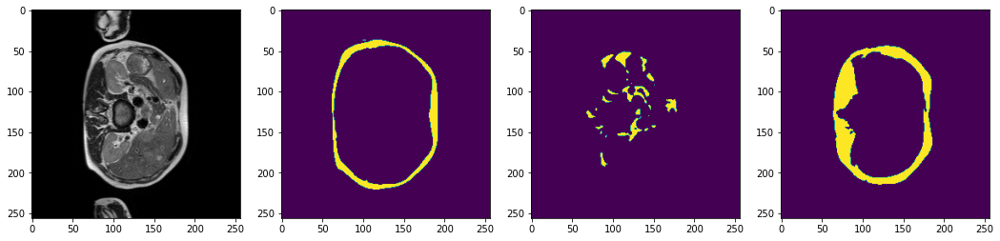

2024-03-28 07:51:27,205 INFO image_writer.py:194 - writing: outMR09fold1/A014_v1_T2W_seg.nii.gz


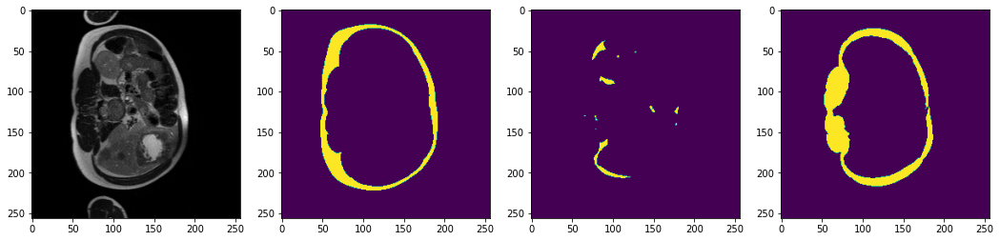

2024-03-28 07:51:29,496 INFO image_writer.py:194 - writing: outMR09fold1/A014_v2_T2W_seg.nii.gz


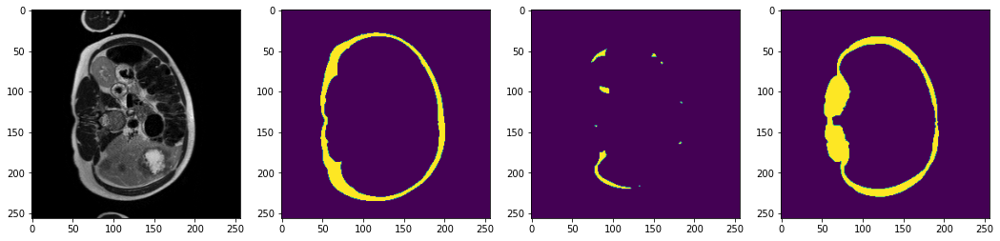

2024-03-28 07:51:31,866 INFO image_writer.py:194 - writing: outMR09fold1/A015_v1_T2W_seg.nii.gz


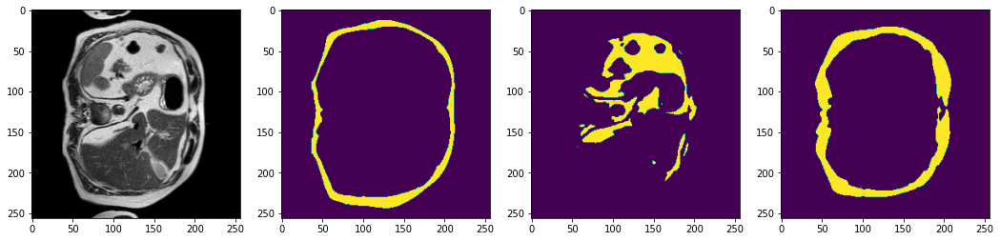

2024-03-28 07:51:34,181 INFO image_writer.py:194 - writing: outMR09fold1/A015_v2_T2W_seg.nii.gz


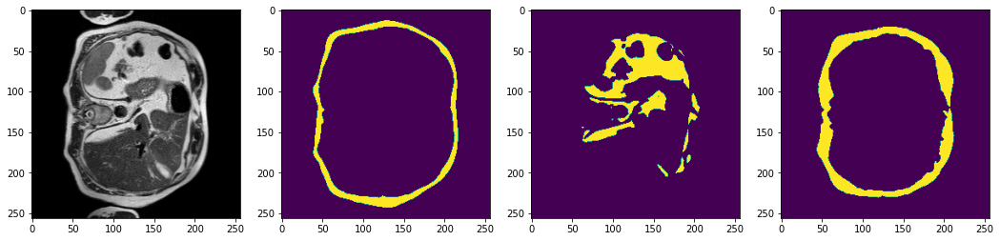

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 07:51:36,562 INFO image_writer.py:194 - writing: outMR09fold1/A016_v1_T2W_seg.nii.gz


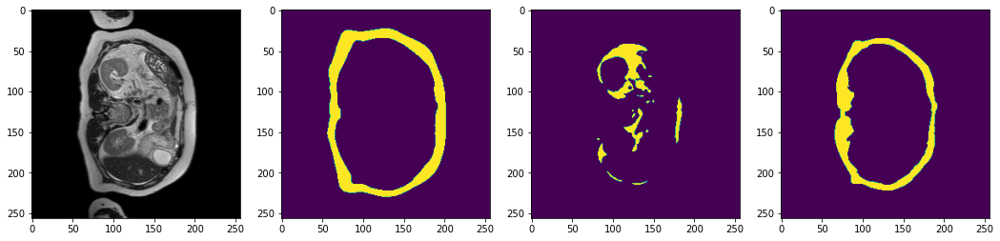

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 07:51:39,037 INFO image_writer.py:194 - writing: outMR09fold1/A016_v2_T2W_seg.nii.gz


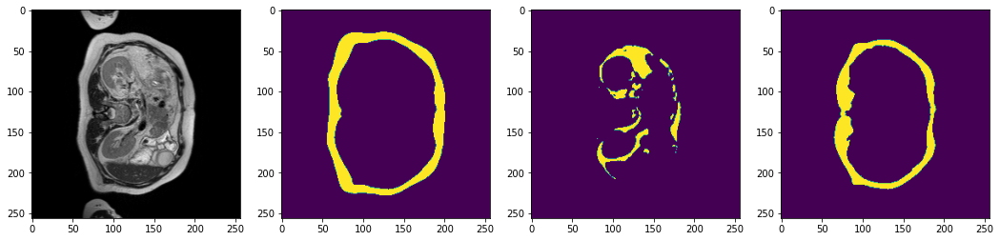

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 07:51:41,379 INFO image_writer.py:194 - writing: outMR09fold1/A017_v1_T2W_seg.nii.gz


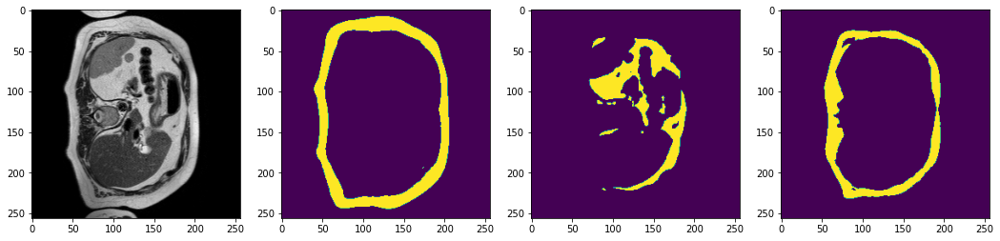

Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


2024-03-28 07:51:43,705 INFO image_writer.py:194 - writing: outMR09fold1/A017_v2_T2W_seg.nii.gz


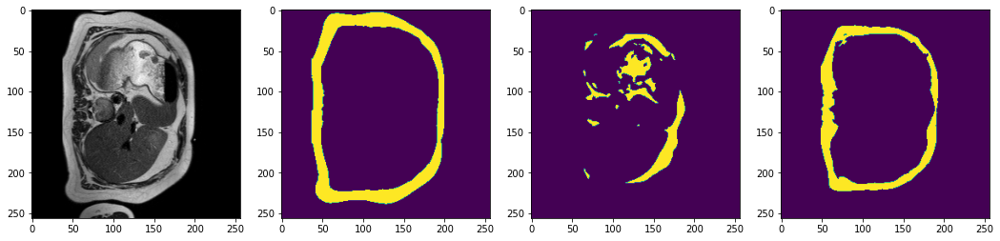

2024-03-28 07:51:46,063 INFO image_writer.py:194 - writing: outMR09fold1/A018_v1_T2W_seg.nii.gz


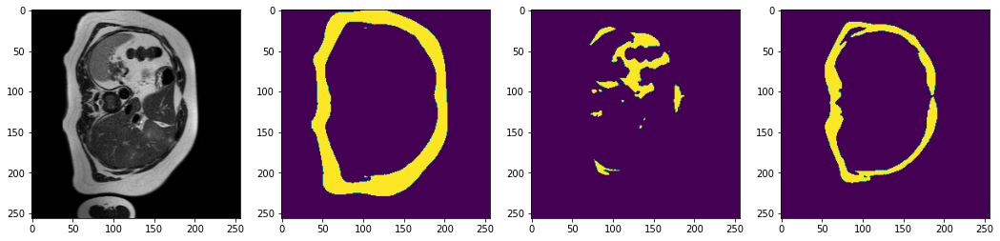

2024-03-28 07:51:48,435 INFO image_writer.py:194 - writing: outMR09fold1/A018_v2_T2W_seg.nii.gz


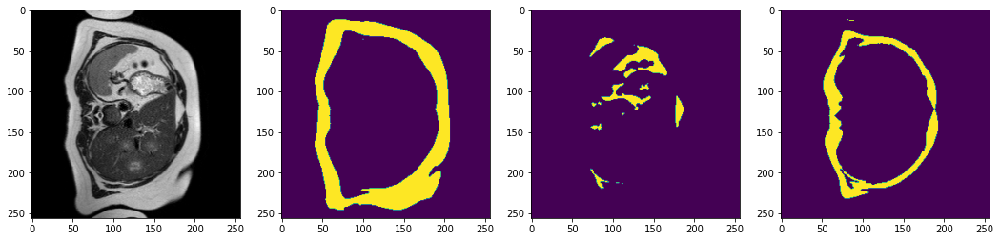

2024-03-28 07:51:50,777 INFO image_writer.py:194 - writing: outMR09fold1/A021_v1_T2W_seg.nii.gz


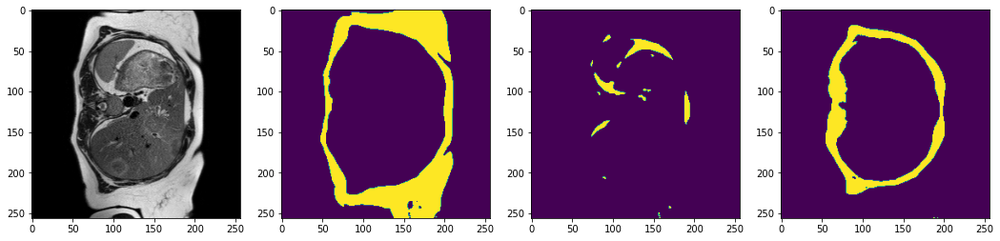

2024-03-28 07:51:53,126 INFO image_writer.py:194 - writing: outMR09fold1/A021_v2_T2W_seg.nii.gz


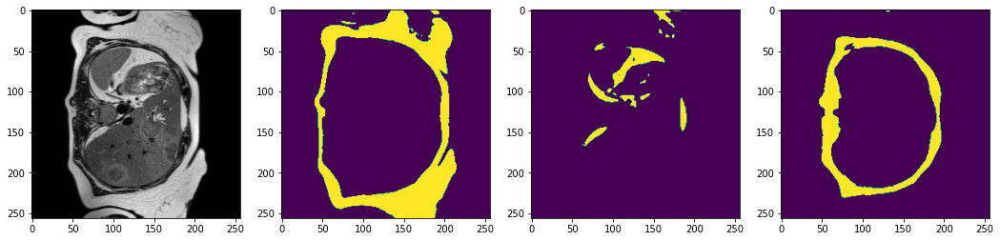

2024-03-28 07:51:58,762 INFO image_writer.py:194 - writing: outMR09fold1/A022_v1_T2W_seg.nii.gz


Modifying image pixdim from [1.4648438 1.4648438 8.        0.       ] to [  1.46484375   1.46484375   8.         281.03604124]


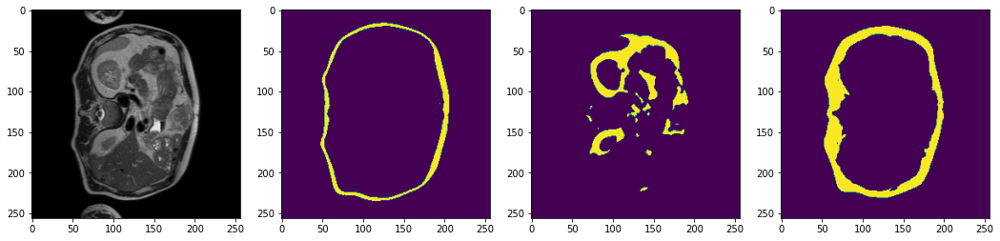

2024-03-28 07:52:04,597 INFO image_writer.py:194 - writing: outMR09fold1/A022_v2_T2W_seg.nii.gz


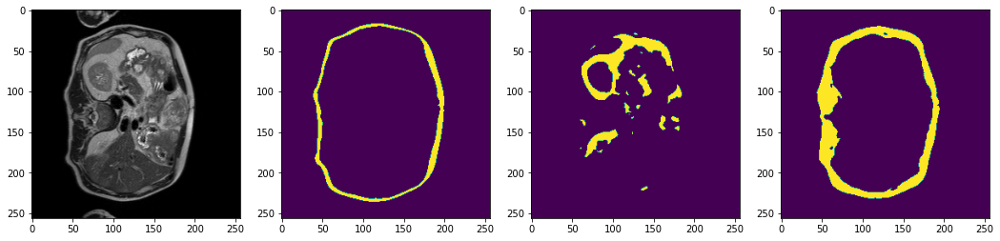

2024-03-28 07:52:10,276 INFO image_writer.py:194 - writing: outMR09fold1/A023_v1_T2W_seg.nii.gz


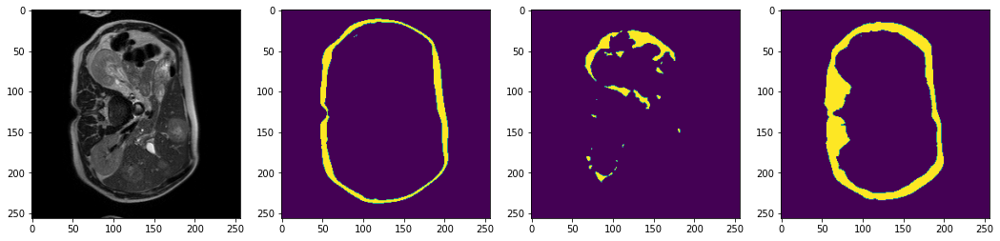

2024-03-28 07:52:15,937 INFO image_writer.py:194 - writing: outMR09fold1/A023_v2_T2W_seg.nii.gz


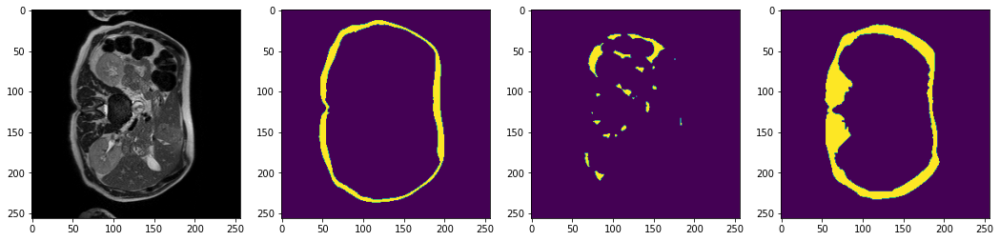

2024-03-28 07:52:18,309 INFO image_writer.py:194 - writing: outMR09fold1/A024_v1_T2W_seg.nii.gz


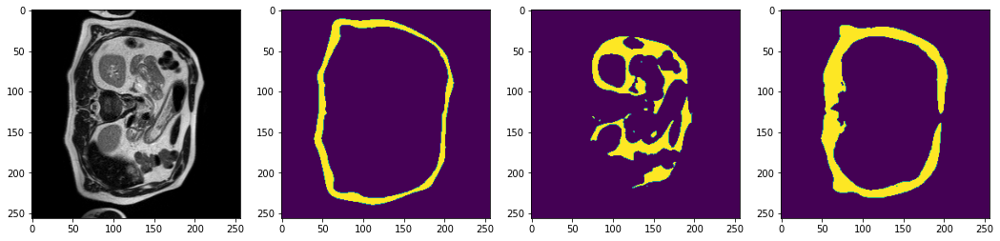

2024-03-28 07:52:20,709 INFO image_writer.py:194 - writing: outMR09fold1/A024_v2_T2W_seg.nii.gz


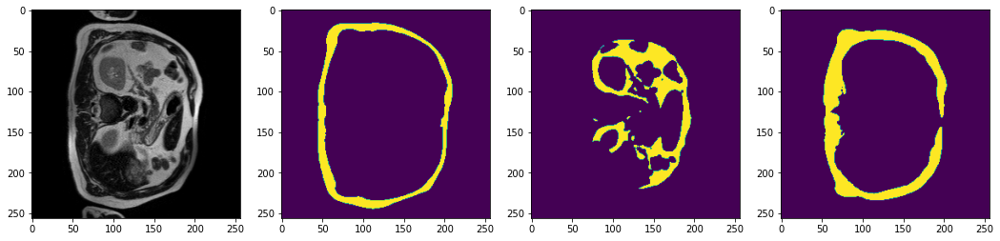

2024-03-28 07:52:26,416 INFO image_writer.py:194 - writing: outMR09fold1/A026_v1_T2W_seg.nii.gz


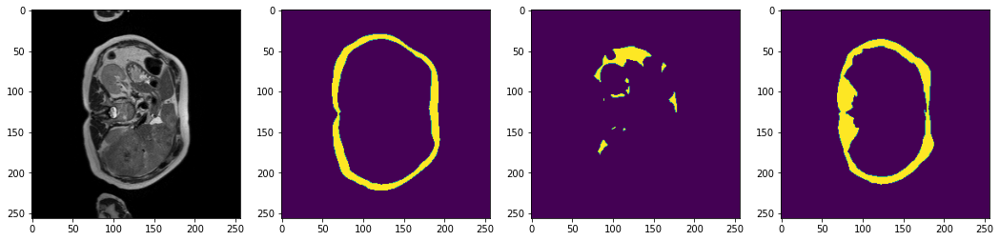

2024-03-28 07:52:32,139 INFO image_writer.py:194 - writing: outMR09fold1/A026_v2_T2W_seg.nii.gz


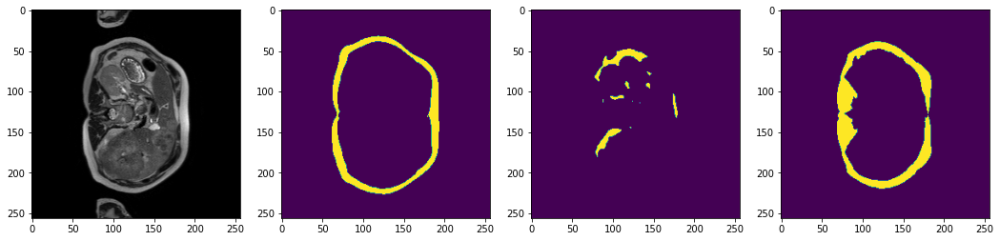

2024-03-28 07:52:34,524 INFO image_writer.py:194 - writing: outMR09fold1/A028_v1_T2W_seg.nii.gz


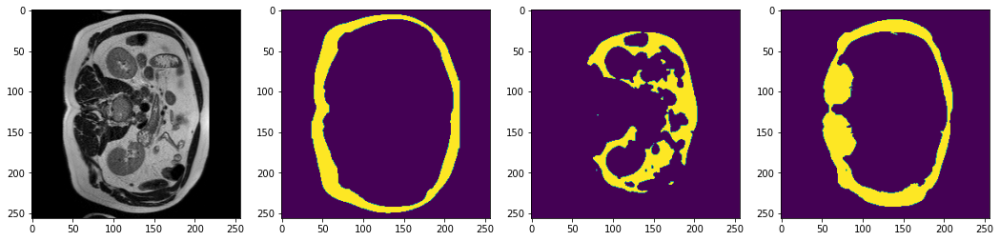

2024-03-28 07:52:36,911 INFO image_writer.py:194 - writing: outMR09fold1/A028_v2_T2W_seg.nii.gz


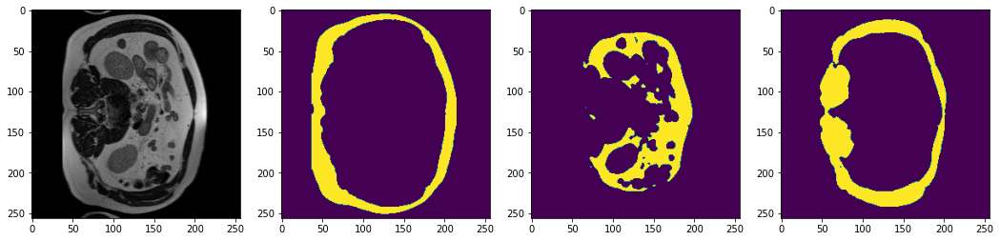

2024-03-28 07:52:39,498 INFO image_writer.py:194 - writing: outMR09fold1/A029_v1_T2W_seg.nii.gz


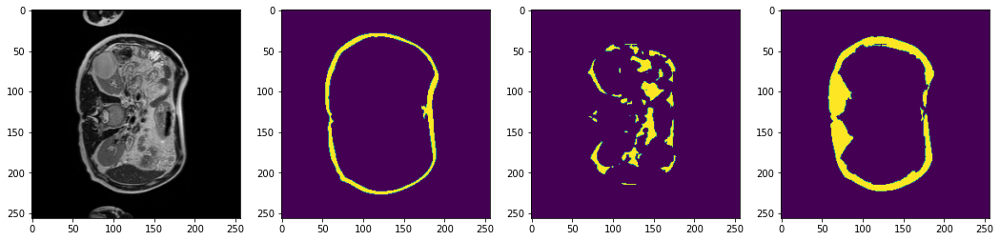

2024-03-28 07:52:41,588 INFO image_writer.py:194 - writing: outMR09fold1/A029_v2_T2W_seg.nii.gz


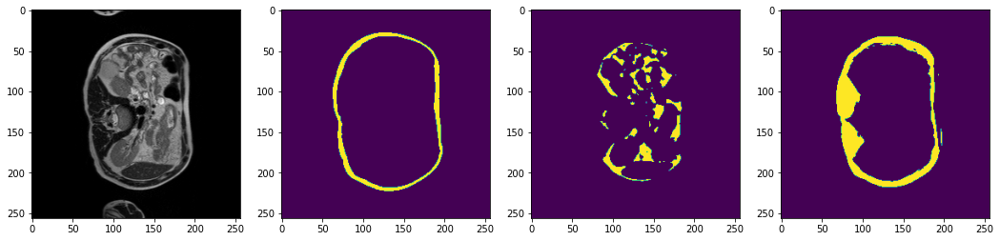

2024-03-28 07:52:43,984 INFO image_writer.py:194 - writing: outMR09fold1/A029_v3_T2W_seg.nii.gz


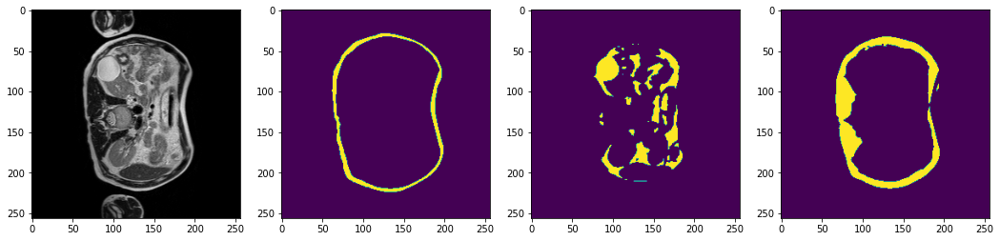

2024-03-28 07:52:46,091 INFO image_writer.py:194 - writing: outMR09fold1/A029_v4_T2W_seg.nii.gz


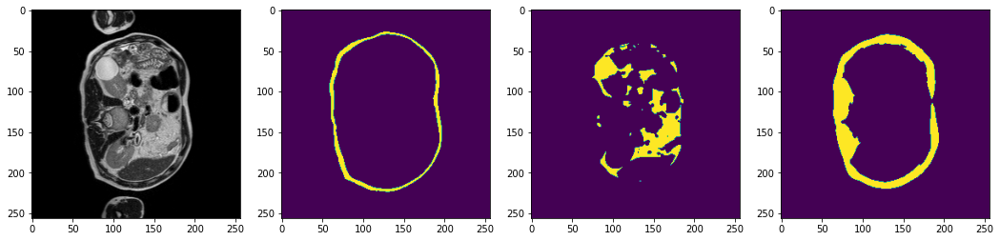

2024-03-28 07:52:48,486 INFO image_writer.py:194 - writing: outMR09fold1/A030_v1_T2W_seg.nii.gz


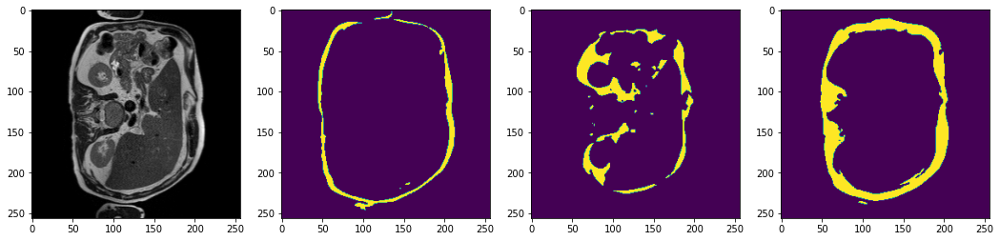

2024-03-28 07:52:50,884 INFO image_writer.py:194 - writing: outMR09fold1/A030_v2_T2W_seg.nii.gz


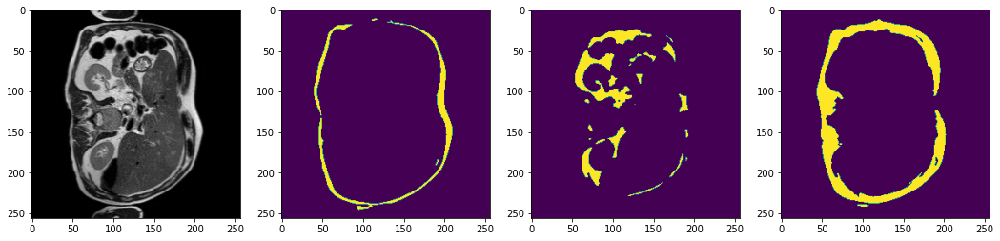

2024-03-28 07:52:52,987 INFO image_writer.py:194 - writing: outMR09fold1/A031_v1_T2W_seg.nii.gz


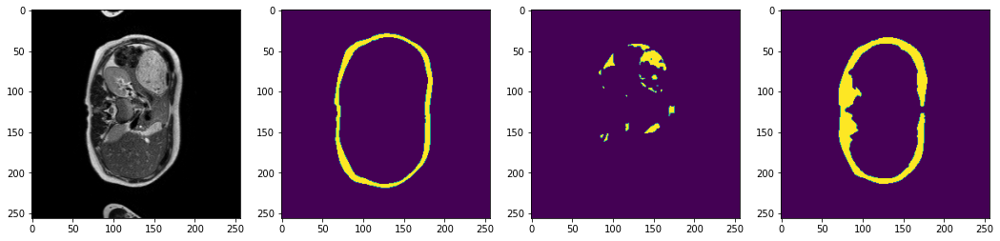

2024-03-28 07:52:55,087 INFO image_writer.py:194 - writing: outMR09fold1/A031_v2_T2W_seg.nii.gz


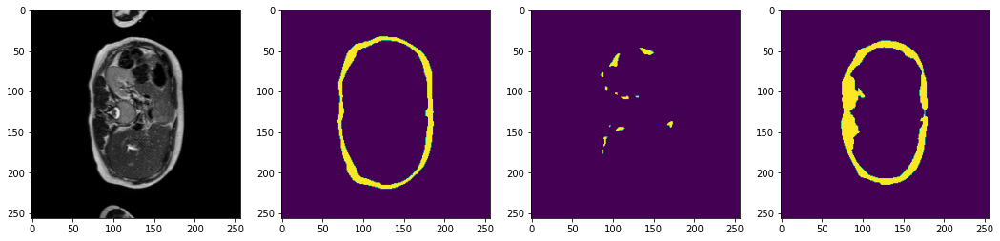

2024-03-28 07:53:00,806 INFO image_writer.py:194 - writing: outMR09fold1/A032_v1_T2W_seg.nii.gz


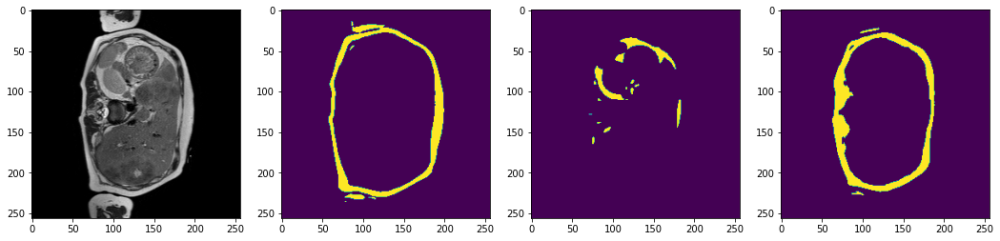

2024-03-28 07:53:06,696 INFO image_writer.py:194 - writing: outMR09fold1/A032_v2_T2W_seg.nii.gz


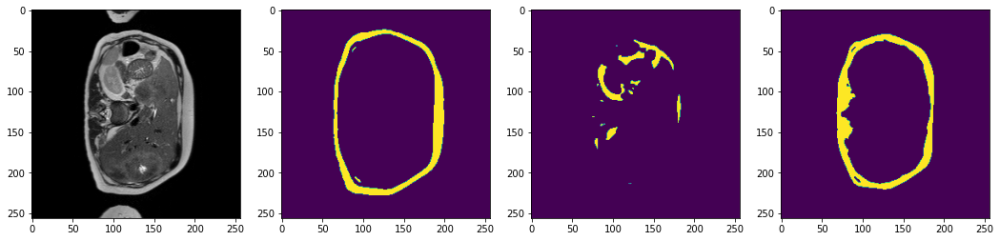

2024-03-28 07:53:12,449 INFO image_writer.py:194 - writing: outMR09fold1/A033_v1_T2W_seg.nii.gz


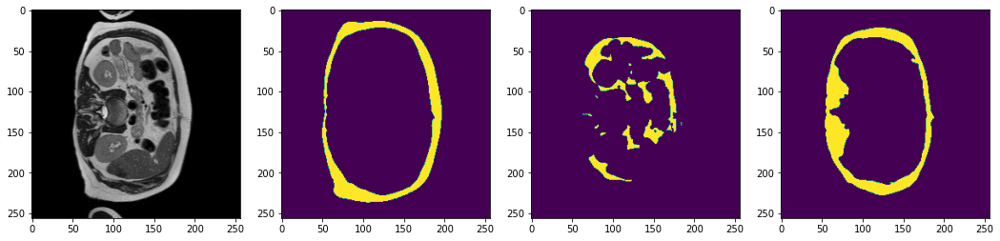

2024-03-28 07:53:18,172 INFO image_writer.py:194 - writing: outMR09fold1/A033_v2_T2W_seg.nii.gz


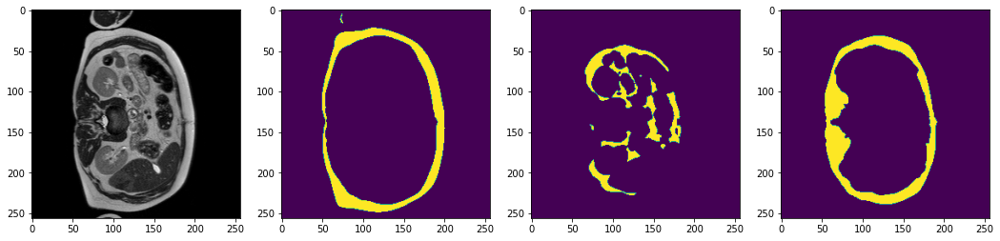

2024-03-28 07:53:23,912 INFO image_writer.py:194 - writing: outMR09fold1/A033_v3_T2W_seg.nii.gz


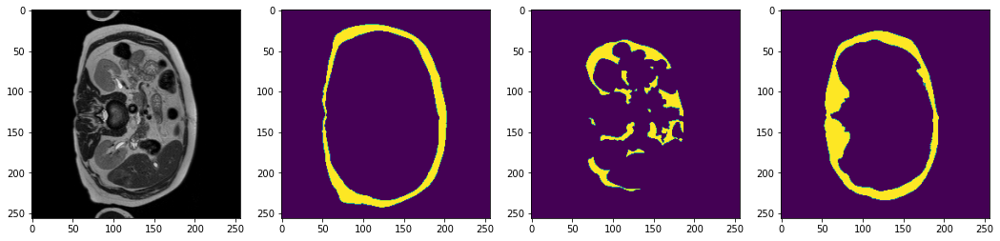

2024-03-28 07:53:29,671 INFO image_writer.py:194 - writing: outMR09fold1/A033_v4_T2W_seg.nii.gz


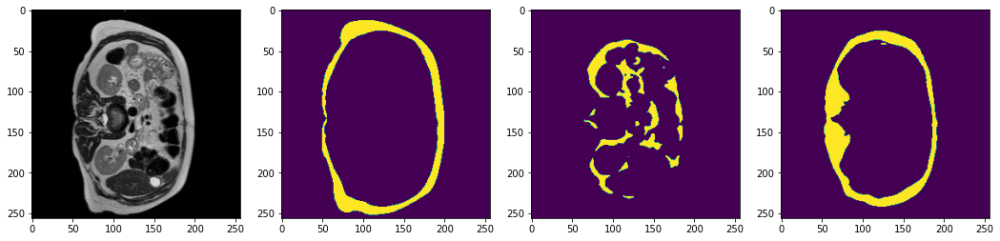

2024-03-28 07:53:35,402 INFO image_writer.py:194 - writing: outMR09fold1/A034_v1_T2W_seg.nii.gz


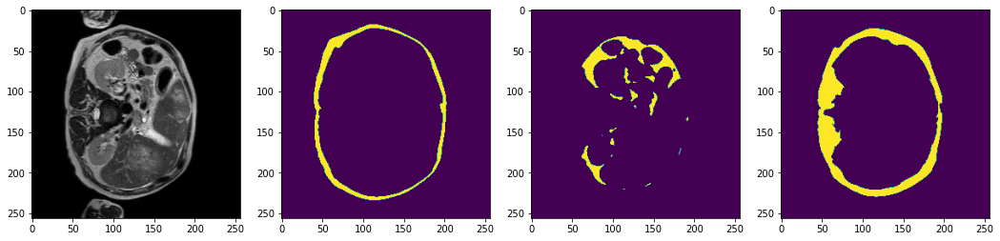

2024-03-28 07:53:41,201 INFO image_writer.py:194 - writing: outMR09fold1/A034_v2_T2W_seg.nii.gz


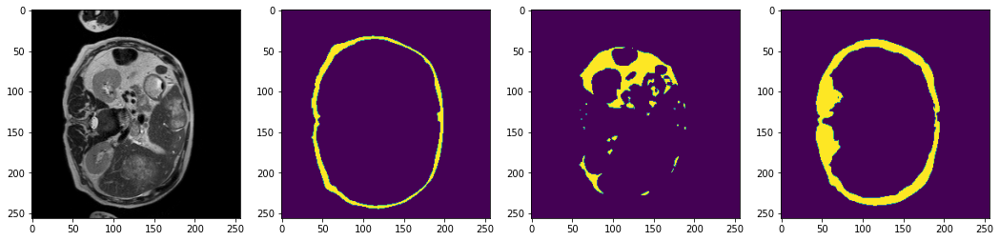

2024-03-28 07:53:46,943 INFO image_writer.py:194 - writing: outMR09fold1/A036_v1_T2W_seg.nii.gz


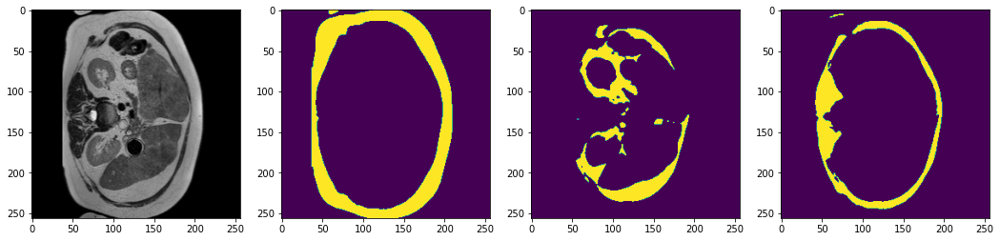

2024-03-28 07:53:52,909 INFO image_writer.py:194 - writing: outMR09fold1/A036_v2_T2W_seg.nii.gz


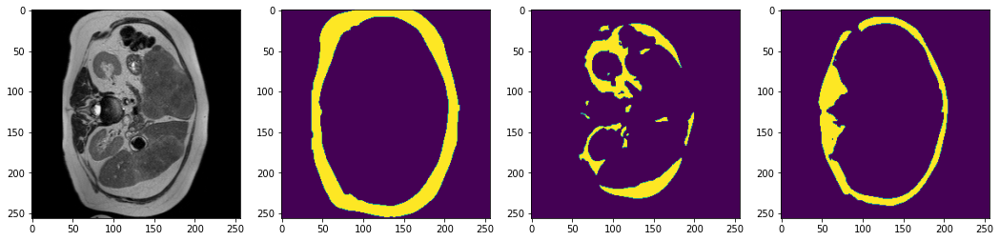

2024-03-28 07:53:57,872 INFO image_writer.py:194 - writing: outMR09fold1/A037_v1_T2W_seg.nii.gz


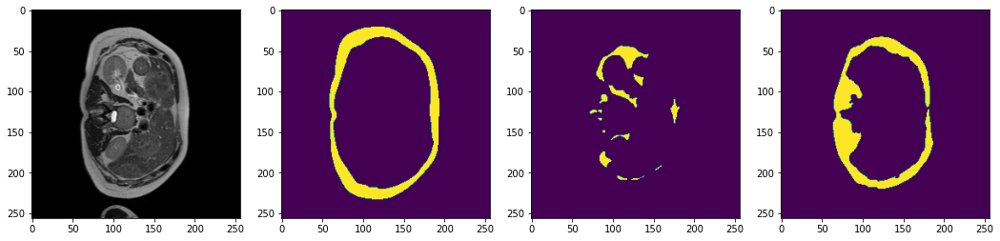

2024-03-28 07:54:03,655 INFO image_writer.py:194 - writing: outMR09fold1/A037_v2_T2W_seg.nii.gz


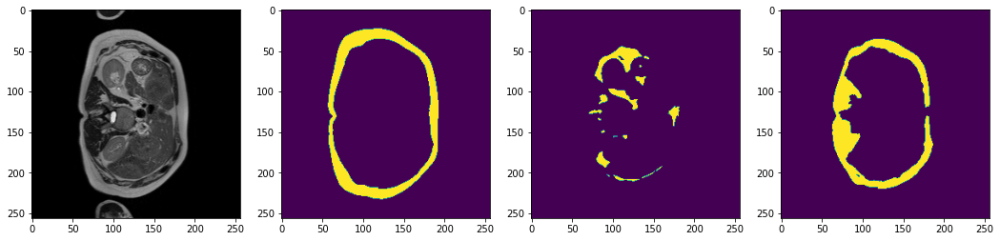

2024-03-28 07:54:06,051 INFO image_writer.py:194 - writing: outMR09fold1/A038_v1_T2W_seg.nii.gz


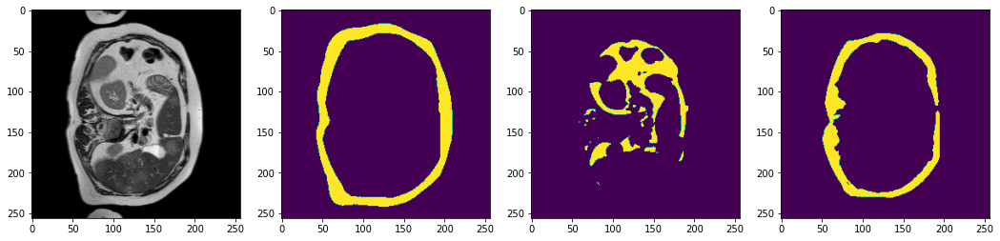

2024-03-28 07:54:08,475 INFO image_writer.py:194 - writing: outMR09fold1/A038_v2_T2W_seg.nii.gz


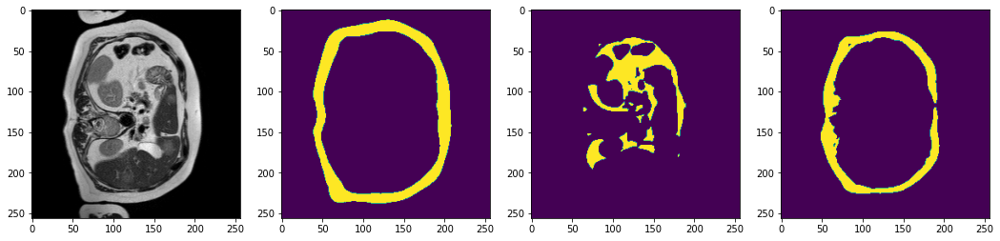

2024-03-28 07:54:10,613 INFO image_writer.py:194 - writing: outMR09fold1/A039_v1_T2W_seg.nii.gz


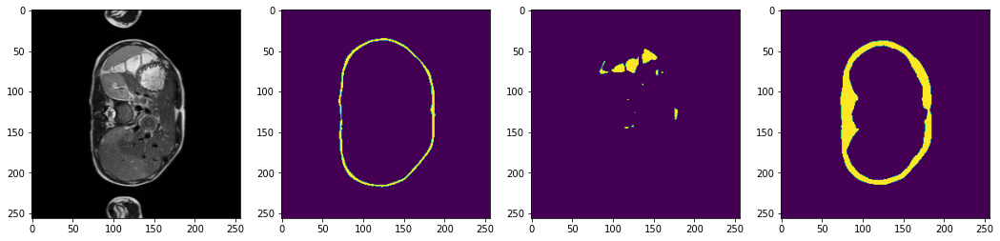

2024-03-28 07:54:12,466 INFO image_writer.py:194 - writing: outMR09fold1/A039_v2_T2W_seg.nii.gz


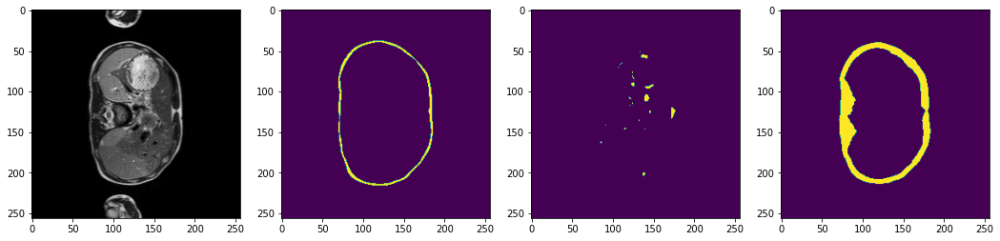

2024-03-28 07:54:18,192 INFO image_writer.py:194 - writing: outMR09fold1/A040_v1_T2W_seg.nii.gz


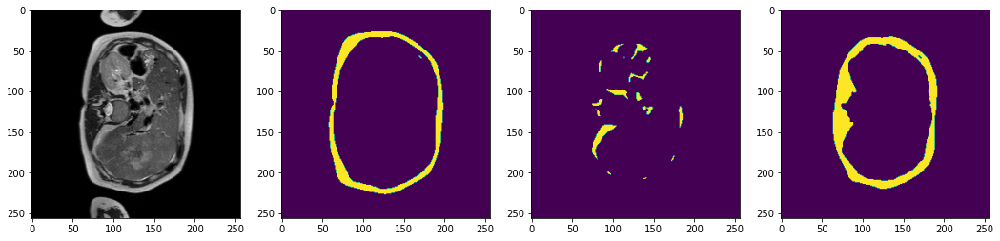

2024-03-28 07:54:23,963 INFO image_writer.py:194 - writing: outMR09fold1/A040_v2_T2W_seg.nii.gz


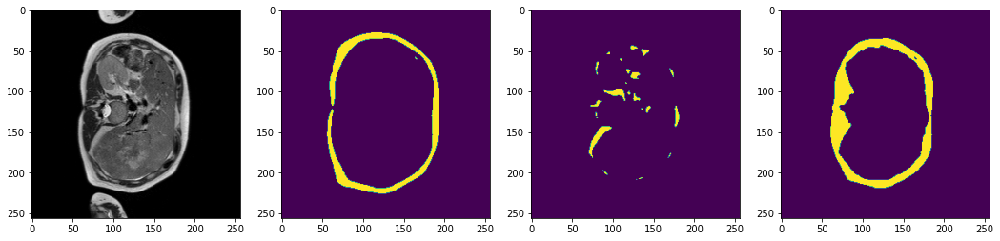

2024-03-28 07:54:26,503 INFO image_writer.py:194 - writing: outMR09fold1/A041_v1_T2W_seg.nii.gz


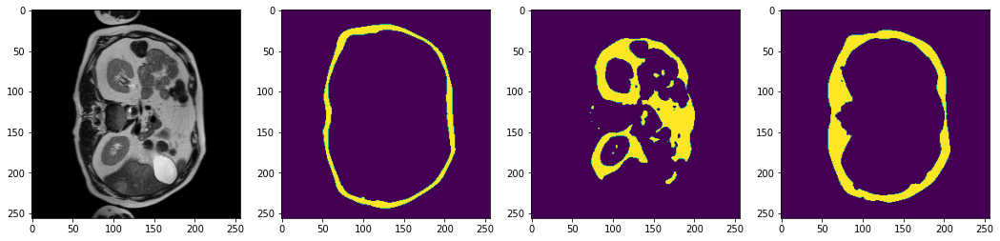

2024-03-28 07:54:28,891 INFO image_writer.py:194 - writing: outMR09fold1/A041_v2_T2W_seg.nii.gz


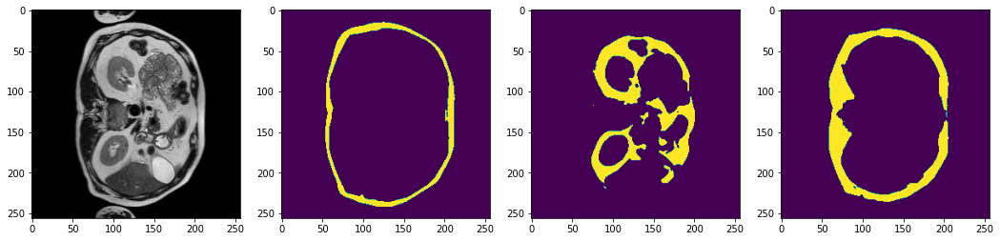

2024-03-28 07:54:34,644 INFO image_writer.py:194 - writing: outMR09fold1/A043_v1_T2W_seg.nii.gz


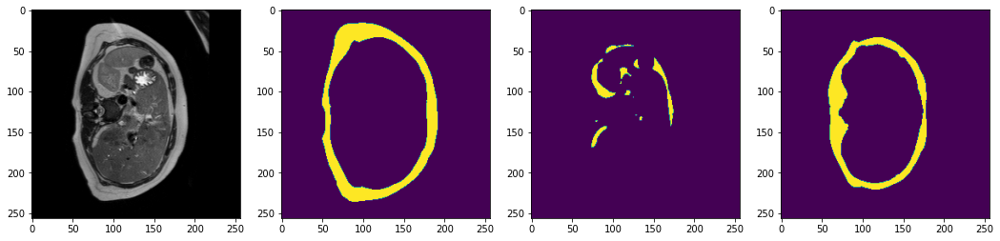

2024-03-28 07:54:40,449 INFO image_writer.py:194 - writing: outMR09fold1/A043_v2_T2W_seg.nii.gz


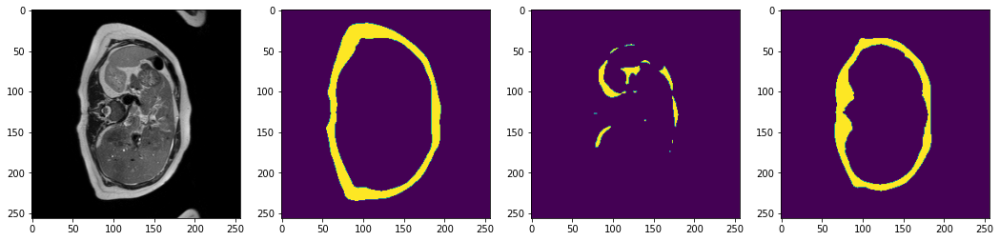

2024-03-28 07:54:46,212 INFO image_writer.py:194 - writing: outMR09fold1/A043_v5_T2W_seg.nii.gz


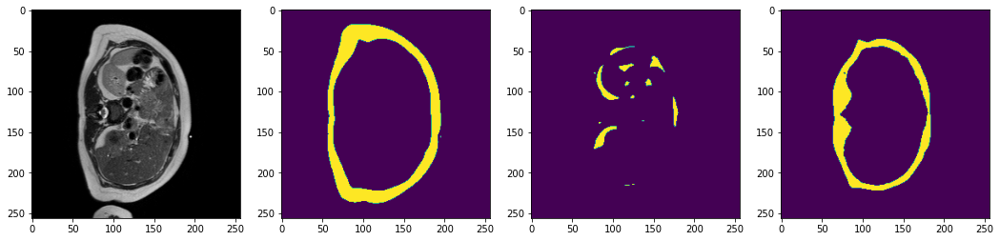

2024-03-28 07:54:48,621 INFO image_writer.py:194 - writing: outMR09fold1/A046_v1_T2W_seg.nii.gz


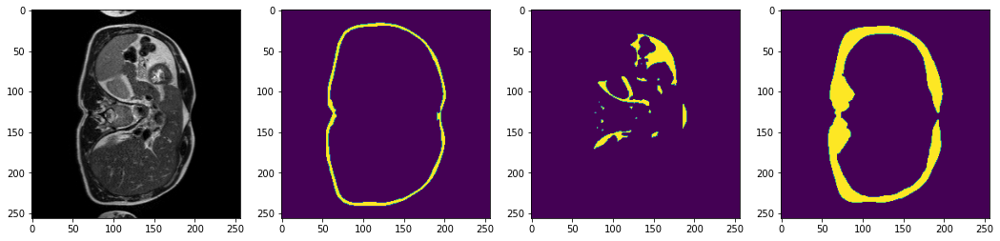

2024-03-28 07:54:51,008 INFO image_writer.py:194 - writing: outMR09fold1/A046_v2_T2W_seg.nii.gz


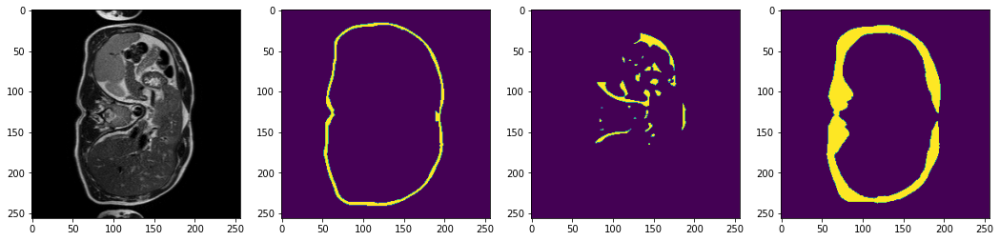

2024-03-28 07:54:53,387 INFO image_writer.py:194 - writing: outMR09fold1/A047_v1_T2W_seg.nii.gz


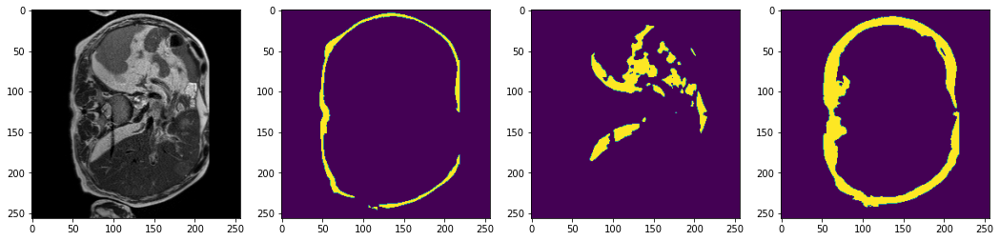

2024-03-28 07:54:55,978 INFO image_writer.py:194 - writing: outMR09fold1/A047_v2_T2W_seg.nii.gz


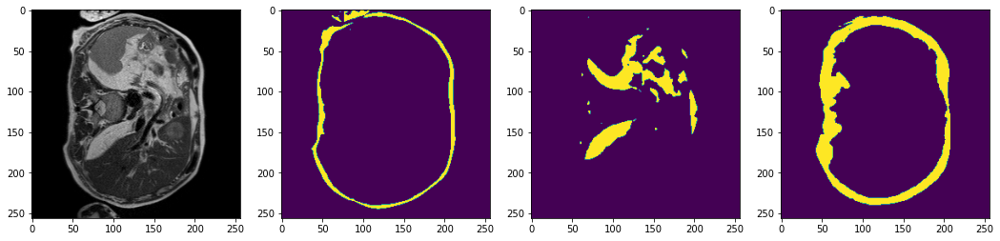

2024-03-28 07:54:58,368 INFO image_writer.py:194 - writing: outMR09fold1/A048_v1_T2W_seg.nii.gz


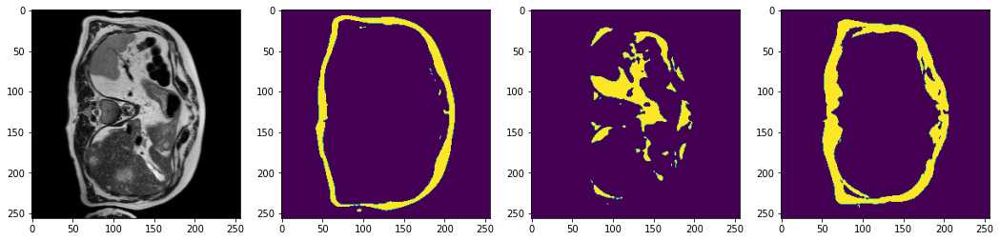

2024-03-28 07:55:00,761 INFO image_writer.py:194 - writing: outMR09fold1/A048_v2_T2W_seg.nii.gz


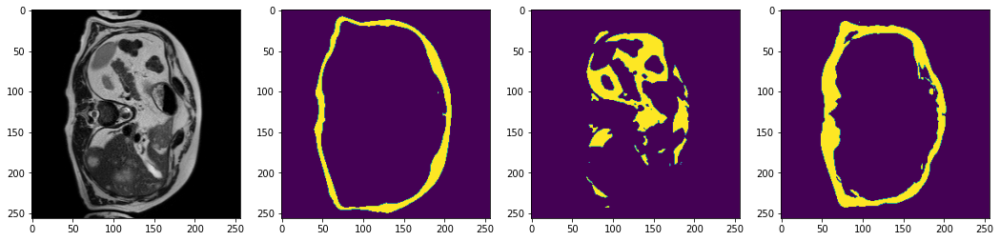

2024-03-28 07:55:03,150 INFO image_writer.py:194 - writing: outMR09fold1/A049_v1_T2W_seg.nii.gz


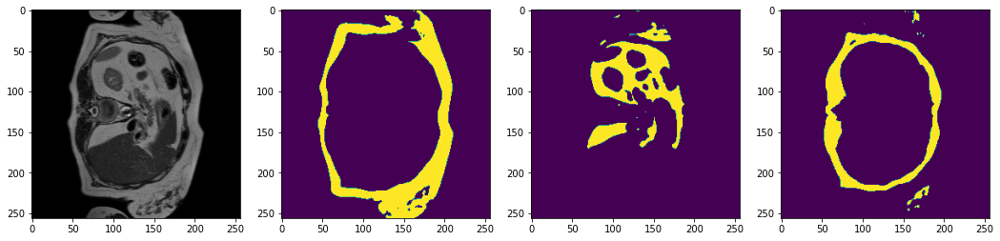

2024-03-28 07:55:05,520 INFO image_writer.py:194 - writing: outMR09fold1/A049_v2_T2W_seg.nii.gz


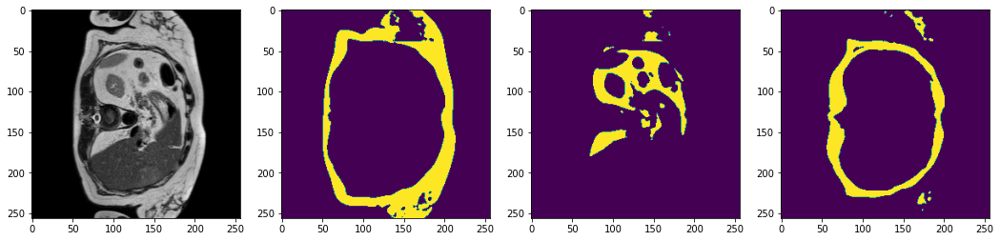

2024-03-28 07:55:07,917 INFO image_writer.py:194 - writing: outMR09fold1/A050_v1_T2W_seg.nii.gz


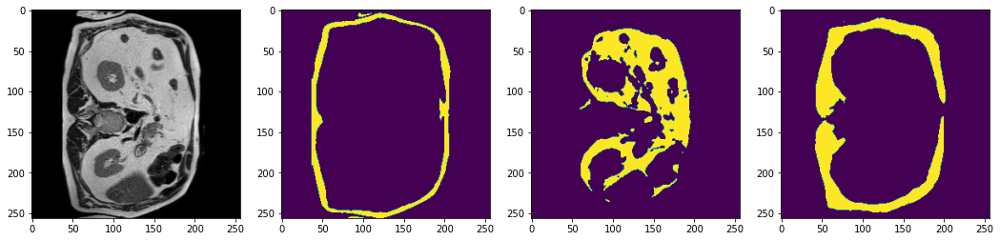

2024-03-28 07:55:10,315 INFO image_writer.py:194 - writing: outMR09fold1/A050_v2_T2W_seg.nii.gz


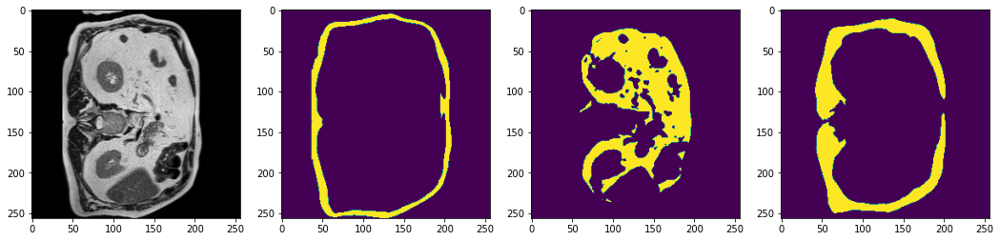

2024-03-28 07:55:12,718 INFO image_writer.py:194 - writing: outMR09fold1/A051_v1_T2W_seg.nii.gz


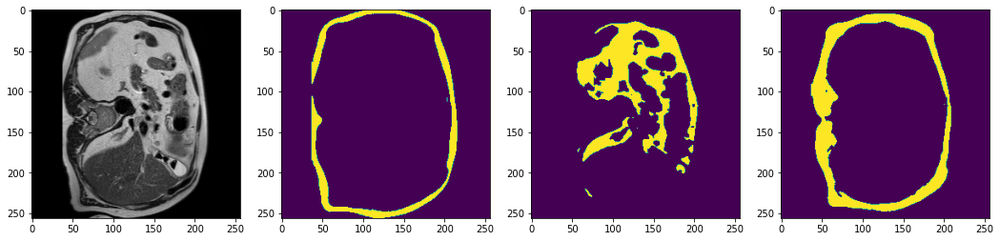

2024-03-28 07:55:15,107 INFO image_writer.py:194 - writing: outMR09fold1/A051_v2_T2W_seg.nii.gz


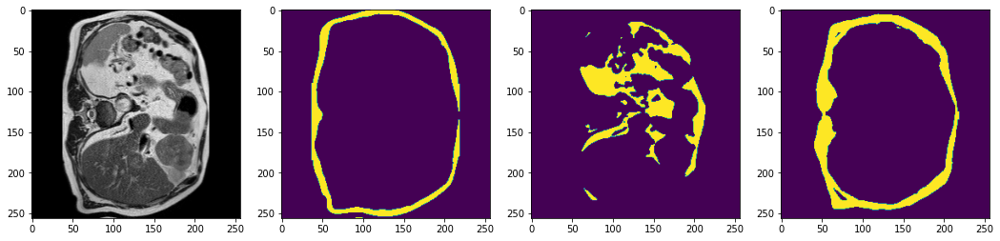

2024-03-28 07:55:21,048 INFO image_writer.py:194 - writing: outMR09fold1/A052_v1_T2W_seg.nii.gz


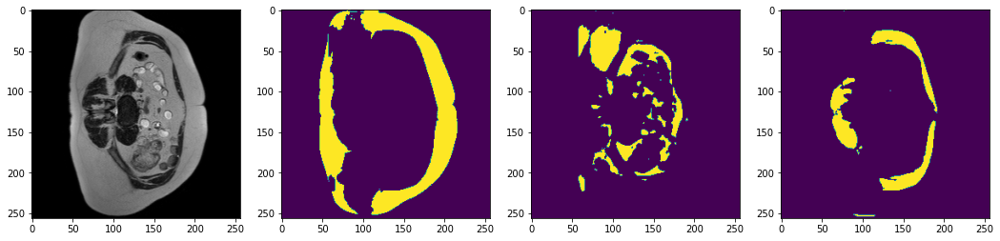

2024-03-28 07:55:26,855 INFO image_writer.py:194 - writing: outMR09fold1/A052_v2_T2W_seg.nii.gz


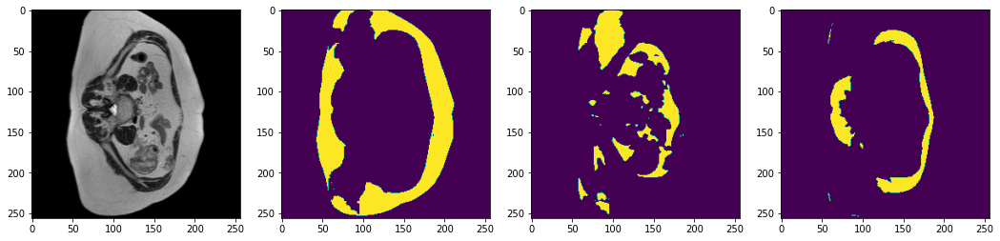

2024-03-28 07:55:29,251 INFO image_writer.py:194 - writing: outMR09fold1/A055_v1_T2W_seg.nii.gz


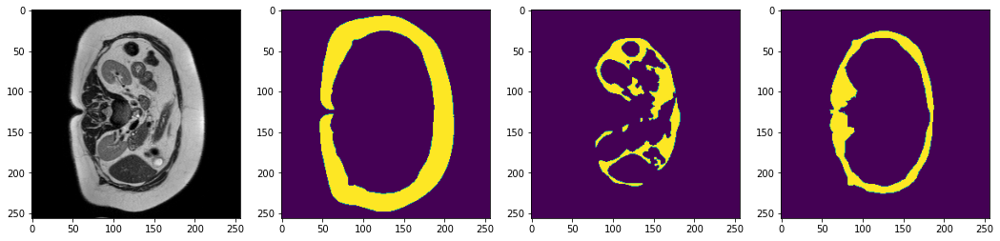

2024-03-28 07:55:31,658 INFO image_writer.py:194 - writing: outMR09fold1/A055_v2_T2W_seg.nii.gz


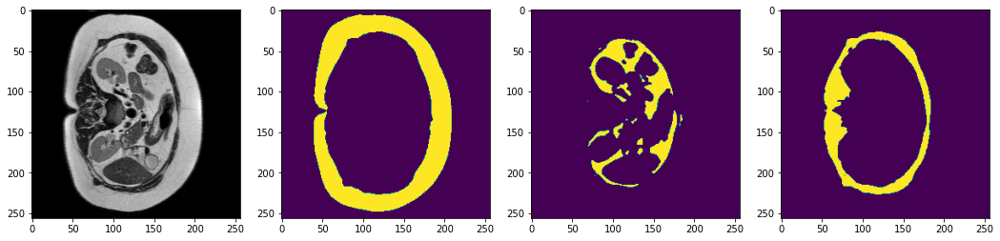

2024-03-28 07:55:34,058 INFO image_writer.py:194 - writing: outMR09fold1/A056_v1_T2W_seg.nii.gz


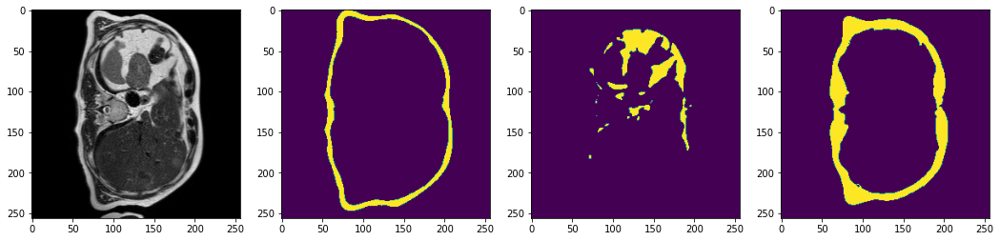

2024-03-28 07:55:36,470 INFO image_writer.py:194 - writing: outMR09fold1/A056_v2_T2W_seg.nii.gz


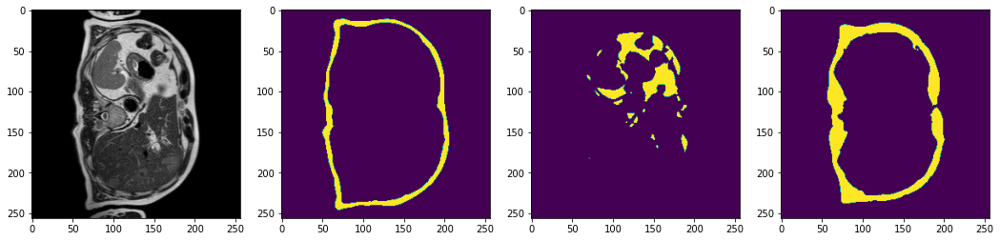

2024-03-28 07:55:38,876 INFO image_writer.py:194 - writing: outMR09fold1/A057_v1_T2W_seg.nii.gz


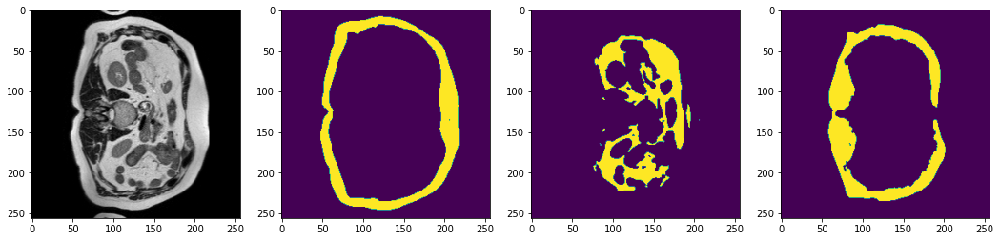

2024-03-28 07:55:41,289 INFO image_writer.py:194 - writing: outMR09fold1/A057_v2_T2W_seg.nii.gz


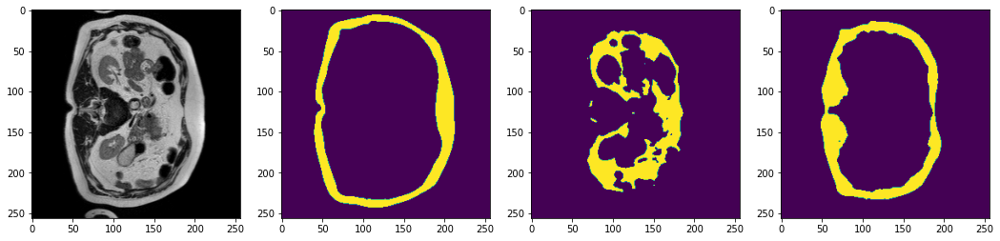

2024-03-28 07:55:47,206 INFO image_writer.py:194 - writing: outMR09fold1/A061_v1_T2W_seg.nii.gz


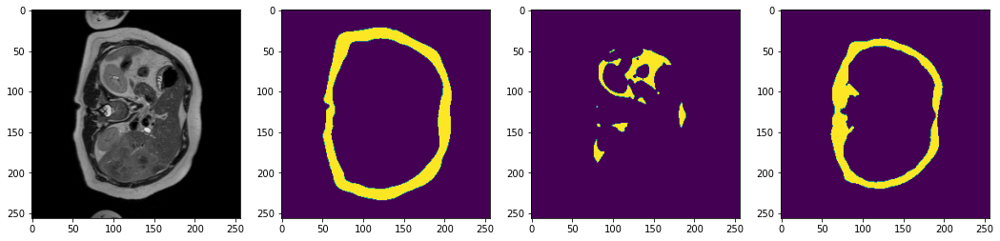

2024-03-28 07:55:52,984 INFO image_writer.py:194 - writing: outMR09fold1/A061_v2_T2W_seg.nii.gz


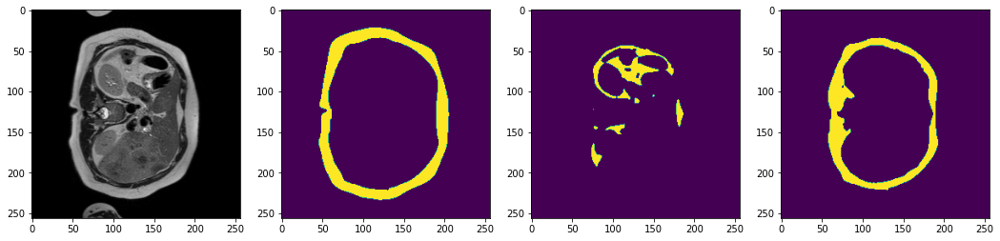

2024-03-28 07:55:55,107 INFO image_writer.py:194 - writing: outMR09fold1/A062_v1_T2W_seg.nii.gz


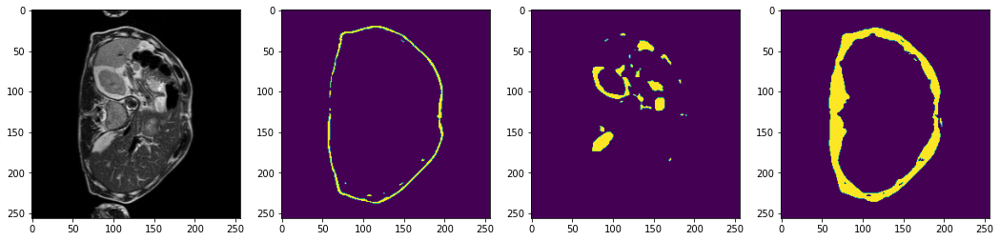

2024-03-28 07:55:57,223 INFO image_writer.py:194 - writing: outMR09fold1/A062_v2_T2W_seg.nii.gz


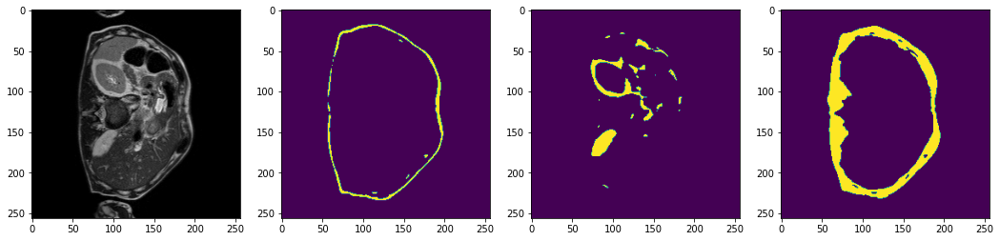

2024-03-28 07:55:59,615 INFO image_writer.py:194 - writing: outMR09fold1/A063_v1_T2W_seg.nii.gz


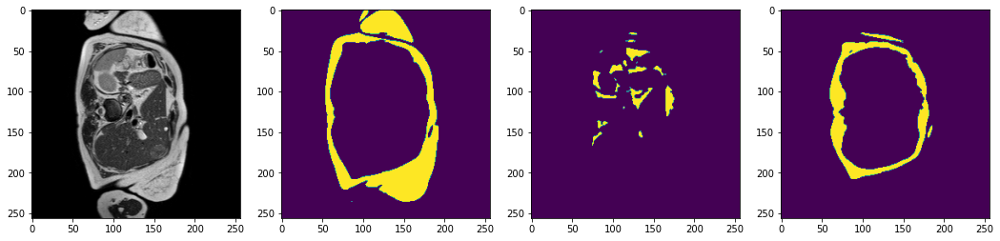

2024-03-28 07:56:02,046 INFO image_writer.py:194 - writing: outMR09fold1/A063_v2_T2W_seg.nii.gz


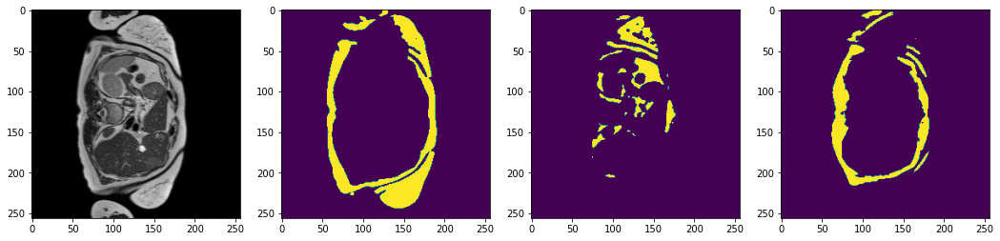

2024-03-28 07:56:04,435 INFO image_writer.py:194 - writing: outMR09fold1/A064_v1_T2W_seg.nii.gz


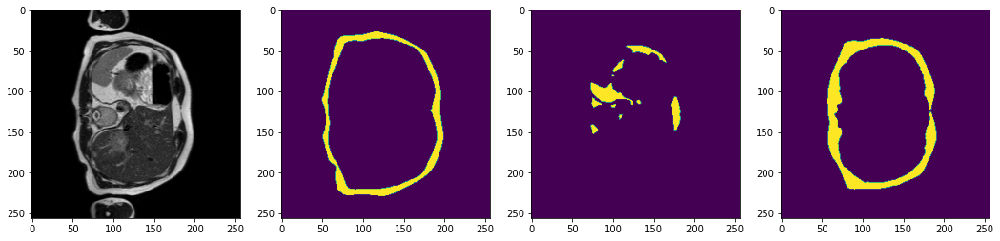

2024-03-28 07:56:06,855 INFO image_writer.py:194 - writing: outMR09fold1/A064_v2_T2W_seg.nii.gz


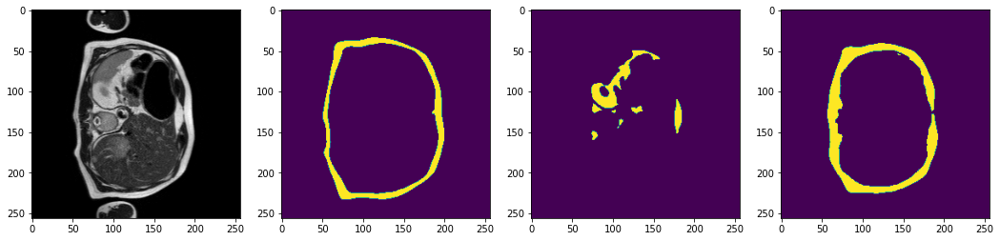

2024-03-28 07:56:09,256 INFO image_writer.py:194 - writing: outMR09fold1/A066_v1_T2W_seg.nii.gz


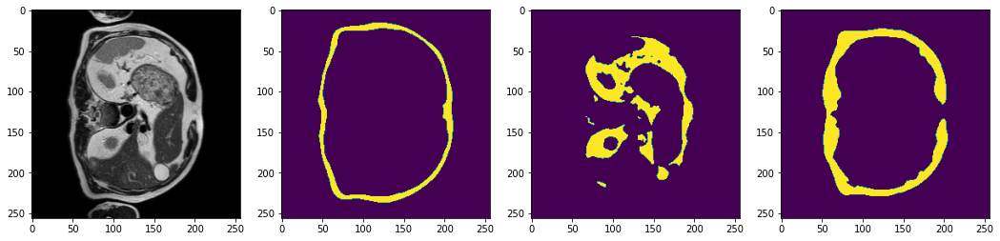

2024-03-28 07:56:11,826 INFO image_writer.py:194 - writing: outMR09fold1/A066_v2_T2W_seg.nii.gz


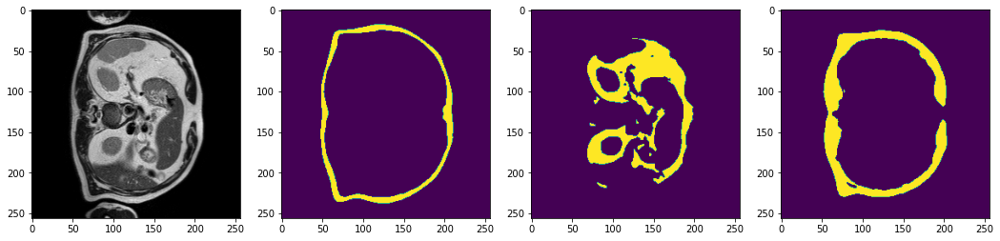

2024-03-28 07:56:14,233 INFO image_writer.py:194 - writing: outMR09fold1/A067_v1_T2W_seg.nii.gz


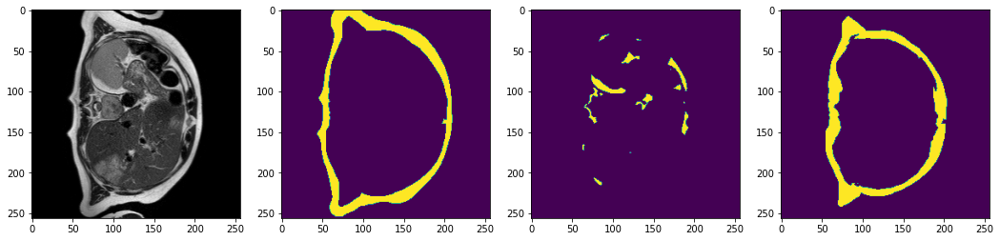

2024-03-28 07:56:16,619 INFO image_writer.py:194 - writing: outMR09fold1/A067_v2_T2W_seg.nii.gz


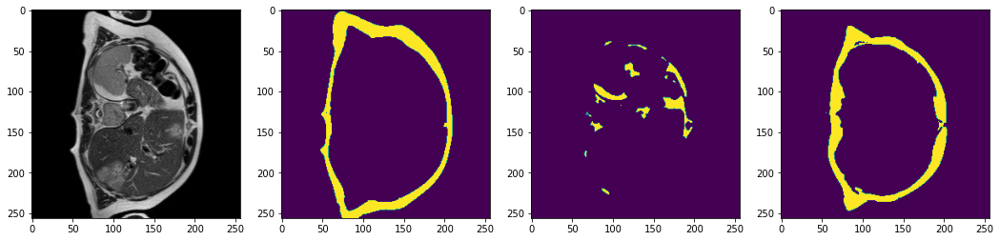

2024-03-28 07:56:18,656 INFO image_writer.py:194 - writing: outMR09fold1/A068_v1_T2W_seg.nii.gz


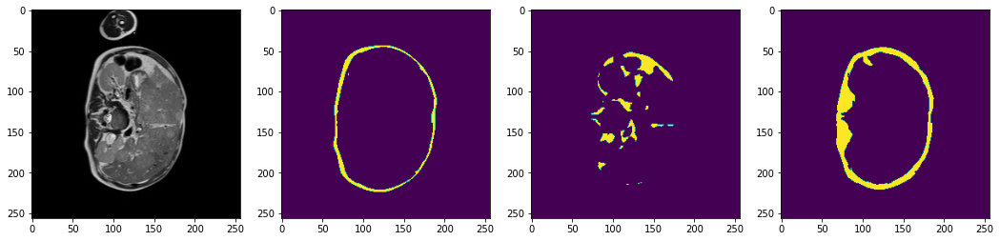

2024-03-28 07:56:20,764 INFO image_writer.py:194 - writing: outMR09fold1/A068_v2_T2W_seg.nii.gz


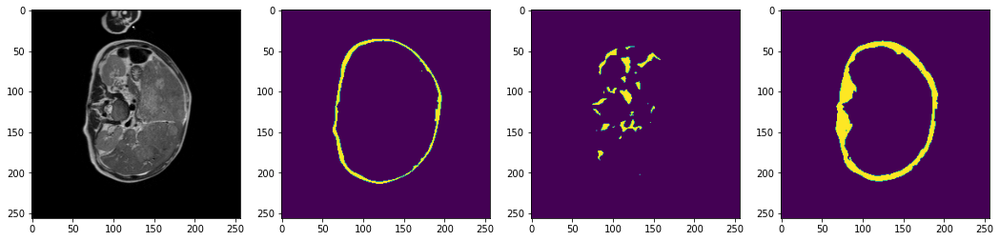

2024-03-28 07:56:25,712 INFO image_writer.py:194 - writing: outMR09fold1/A071_v1_T2W_seg.nii.gz


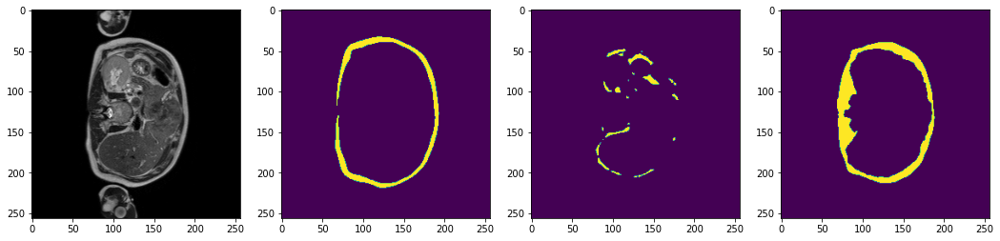

2024-03-28 07:56:30,632 INFO image_writer.py:194 - writing: outMR09fold1/A071_v2_T2W_seg.nii.gz


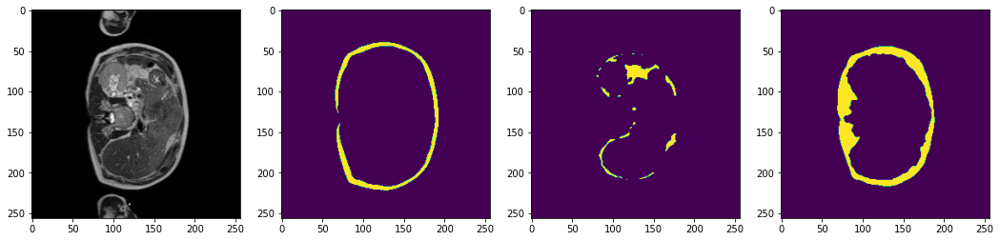

2024-03-28 07:56:35,598 INFO image_writer.py:194 - writing: outMR09fold1/A074_v1_T2W_seg.nii.gz


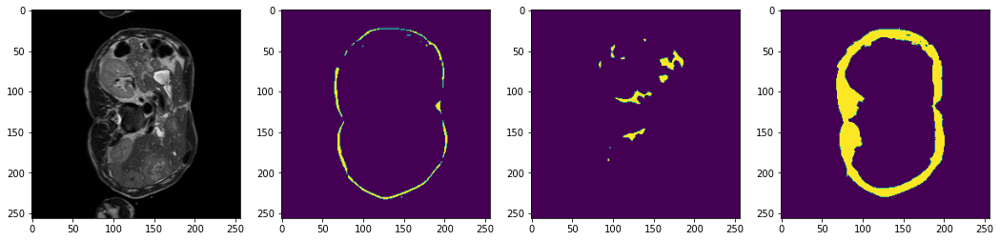

2024-03-28 07:56:41,630 INFO image_writer.py:194 - writing: outMR09fold1/A074_v2_T2W_seg.nii.gz


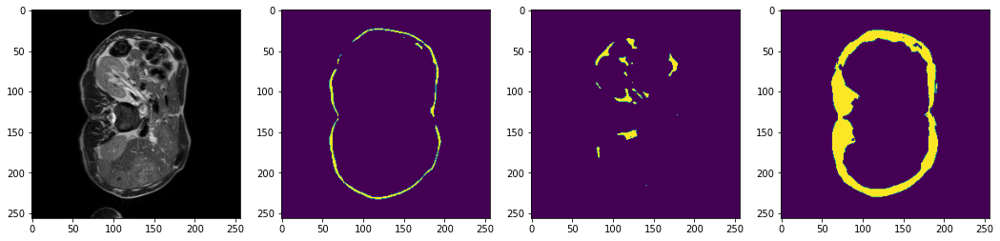

2024-03-28 07:56:43,752 INFO image_writer.py:194 - writing: outMR09fold1/A076_v1_T2W_seg.nii.gz


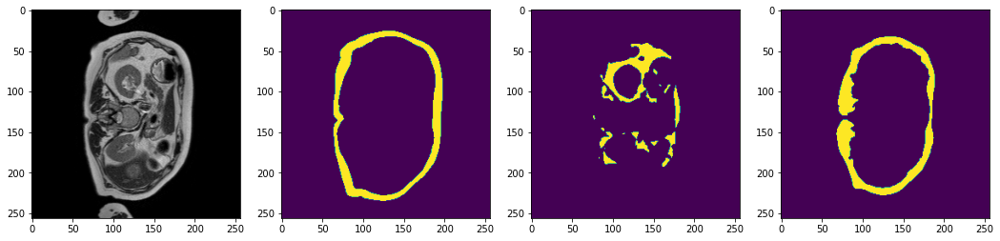

2024-03-28 07:56:46,173 INFO image_writer.py:194 - writing: outMR09fold1/A076_v2_T2W_seg.nii.gz


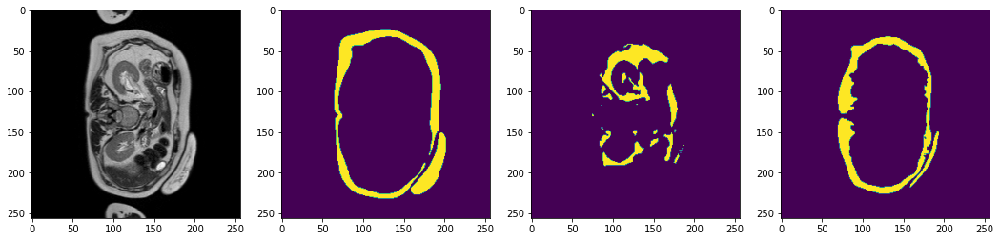

In [8]:
from monai.transforms import LoadImage
loader = LoadImage()

model.load_state_dict(torch.load(
    os.path.join(root_dir, "TestMR09_unetrensemble_fold1.pth")))
model.eval()

with torch.no_grad():
    for test_data in test_org_loader:
        test_inputs = test_data["image"].to(device)
        roi_size = (96, 96, 16)
        sw_batch_size = 4
        test_data["pred"] = sliding_window_inference(
            test_inputs, roi_size, sw_batch_size, model, overlap=0.8)

        test_data = [post_transforms(i) for i in decollate_batch(test_data)]

#         # uncomment the following lines to visualize the predicted results
        test_output = from_engine(["pred"])(test_data)

        original_image = loader(test_data[0]["image_meta_dict"]["filename_or_obj"])[0]

        plt.figure("check", (18, 6))
        plt.subplot(1, 4, 1)
        plt.imshow(original_image[:, :, 8], cmap="gray")
        plt.subplot(1, 4, 2)
        plt.imshow(test_output[0].detach().cpu()[2, :, :, 8])
        plt.subplot(1, 4, 3)
        plt.imshow(test_output[0].detach().cpu()[3, :, :, 8])
        plt.subplot(1, 4, 4)
        plt.imshow(test_output[0].detach().cpu()[5, :, :, 8])
        plt.show()

In [ ]:
!tar -cvzf outMR09fold1.tar.gz outMR09fold1